In [387]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [303]:
%matplotlib inline
%config InlineBackend.figure_format="retina"

plt.rcParams["figure.figsize"]=(10, 10)
sns.set(style="whitegrid")
sns.set_context("notebook", font_scale=1.5)

pd.options.display.max_rows = 300
pd.options.display.max_columns = 80

In [304]:
# План работы:
#
# 1. Кластеризировать на основе временнова коэфиициента (время дистанции/время шагов)
# 2. Восстановить дистанцию и скорость на основании кластеров из п.1
# 3. Кластеризировать на основании восстановленной дистанции и времени, скорости шагов и их количества
# 4. Проанализировать новые кластеры
# 5. Во время работ подтвердить или опровергнуть 2 теории:
#    - скорость шагов в шаг/ceк
#    - скорость шагов в шаг/мин
# 6. Описать данные
# 7. Сделать выводы по кластерам
# 8. Разобраться с выброшенными во время анализа данными

In [305]:
data = pd.read_csv('query_result_for_Test.csv', index_col = 'activity_id').sort_index()

In [306]:
data['len_step'] = data['distance']/data['steps_count']

In [307]:
# Как было:

Text(0, 0.5, 'Steps speed')

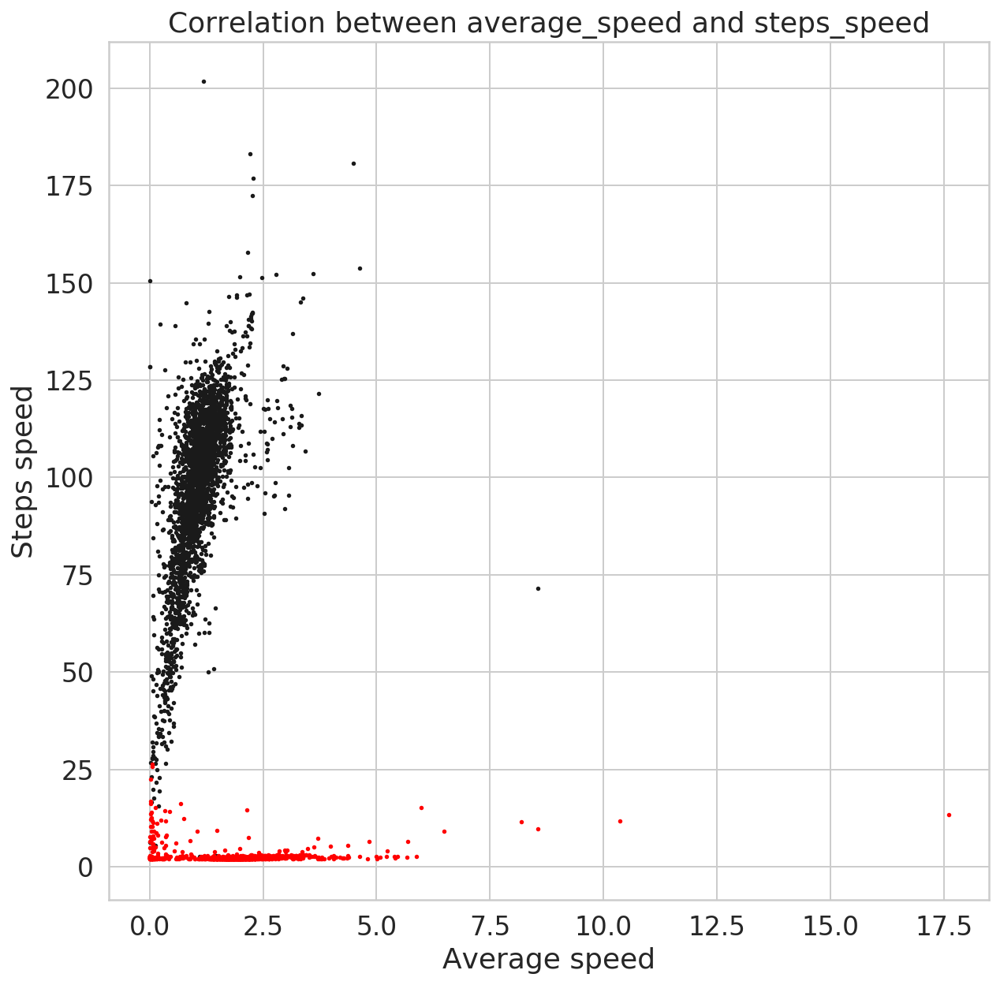

In [308]:
plt.scatter(data.query("mobility_type_of_workout == 2")['average_speed'],
            data.query("mobility_type_of_workout == 2")['steps_speed'],
            s = 3, c='k')
plt.scatter(data.query("mobility_type_of_workout != 2")['average_speed'],
            data.query("mobility_type_of_workout != 2")['steps_speed'],            
            s = 3, c='red')
plt.title('Correlation between average_speed and steps_speed')
plt.xlabel('Average speed')
plt.ylabel('Steps speed')

In [309]:
# 1. Кластеризировать на основе временнова коэфиициента (время дистанции/время шагов)

In [310]:
data['time_distance'] = data['distance']/data['average_speed']
data['time_steps'] = data['steps_count']/data['steps_speed']
data['time_coef'] = data['time_distance']/data['time_steps']
data['steps_coef']  = data['steps_speed']/data['mean_steps_per_second']

In [311]:
data['steps_speed_sec'] = data['steps_speed']/60
data['time_steps_sec'] = data['steps_count']/data['steps_speed_sec']
data['time_coef_sec'] = data['time_distance']/data['time_steps_sec']
data['steps_coef_sec']  = data['steps_speed_sec']/data['mean_steps_per_second']

In [312]:
print(len(data))
trash_data_0 = [37436]
data.drop(trash_data_0, axis=0, inplace=True)
print(len(data))

4662
4661


In [313]:
data['time_distance_hr'] = data['time_distance']/3600
data['time_steps_hr'] = data['time_steps']/3600
data['time_steps_hr_sec'] = data['time_steps_sec']/3600

In [314]:
data['average_pace_s_m'] = data['average_pace']*60/1000
data['u_average_pace_m_s'] = 1/data['average_pace_s_m']

In [315]:
data.loc[(data['time_coef_sec']<0.018) & (True), 'time_coef_label_sec'] = '<0.018_sec'
data.loc[(data['time_coef_sec']>0.018) & (data['time_coef_sec']<3), 'time_coef_label_sec'] = '[0.018;3]_sec'
data.loc[(data['time_coef_sec']>3) & (True), 'time_coef_label_sec'] = '>3_sec'

In [316]:
data['time_coef_label_sec'].value_counts()

[0.018;3]_sec    2646
<0.018_sec       1276
>3_sec             68
Name: time_coef_label_sec, dtype: int64

In [326]:
print(len(data))
trash_data_1 = [79448, 92498, 33074, 46107, 31864, 74291, 42032,\
              38904, 99652, 15892, 81373, 16008, 57081, 42305]
data.drop(trash_data_1, axis=0, inplace=True)
len(data)

4645

In [327]:
time_coef_group_names_sec = data['time_coef_label_sec'].value_counts().index
palette_sec = sns.color_palette(None, len(time_coef_group_names_sec))

In [328]:
list_U_feature_sec = ['average_speed',  'u_average_pace_m_s', 'steps_speed_sec']
list_time_feature_sec = ['time_coef_sec', 'steps_coef_sec', 'time_distance_hr','time_steps_hr_sec']
list_diff_feature = ['pulse_average', 'distance', 'len_step']

In [329]:
# Предположим, что step_speed был дан в шагах в минуту, тогда:

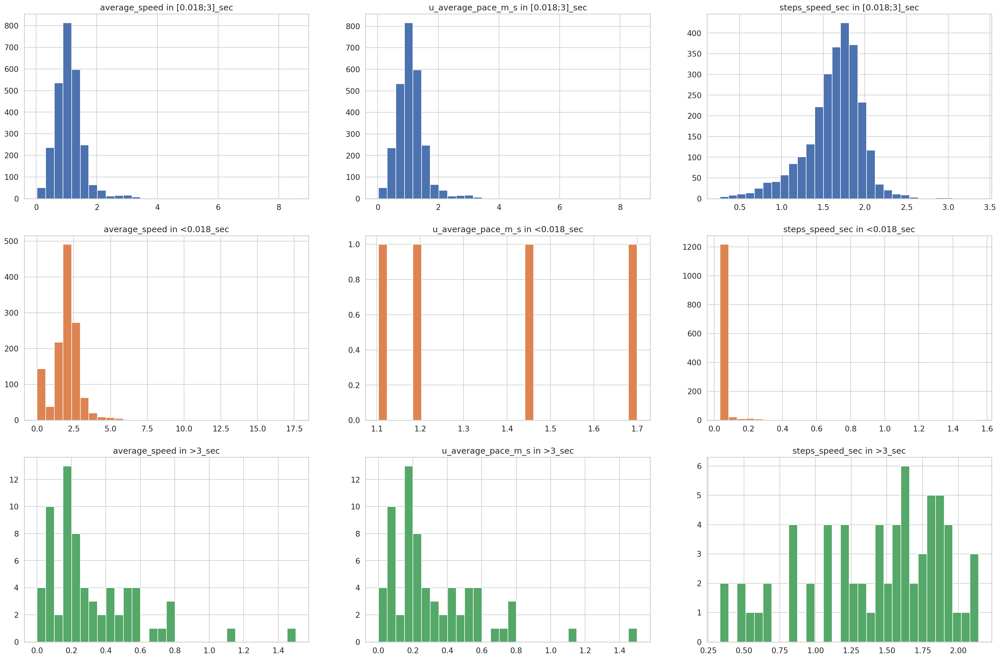

In [330]:
fig, ax = plt.subplots(len(time_coef_group_names_sec),len(list_U_feature_sec), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_U_feature_sec):
    for num_name, name in enumerate(time_coef_group_names_sec):
        data.loc[(True)&(data['time_coef_label_sec']== name)][feature].\
        hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ str(name))

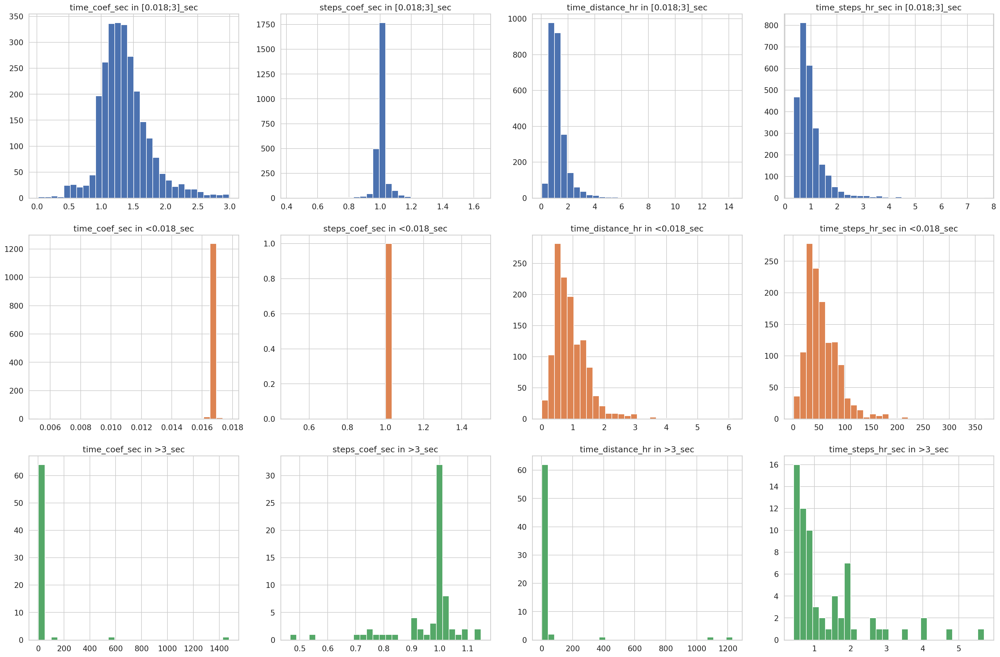

In [331]:
fig, ax = plt.subplots(len(time_coef_group_names_sec),len(list_time_feature_sec), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_time_feature_sec):
    for num_name, name in enumerate(time_coef_group_names_sec):
        data.loc[(True)&(data['time_coef_label_sec']== name)][feature].\
        hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ str(name))

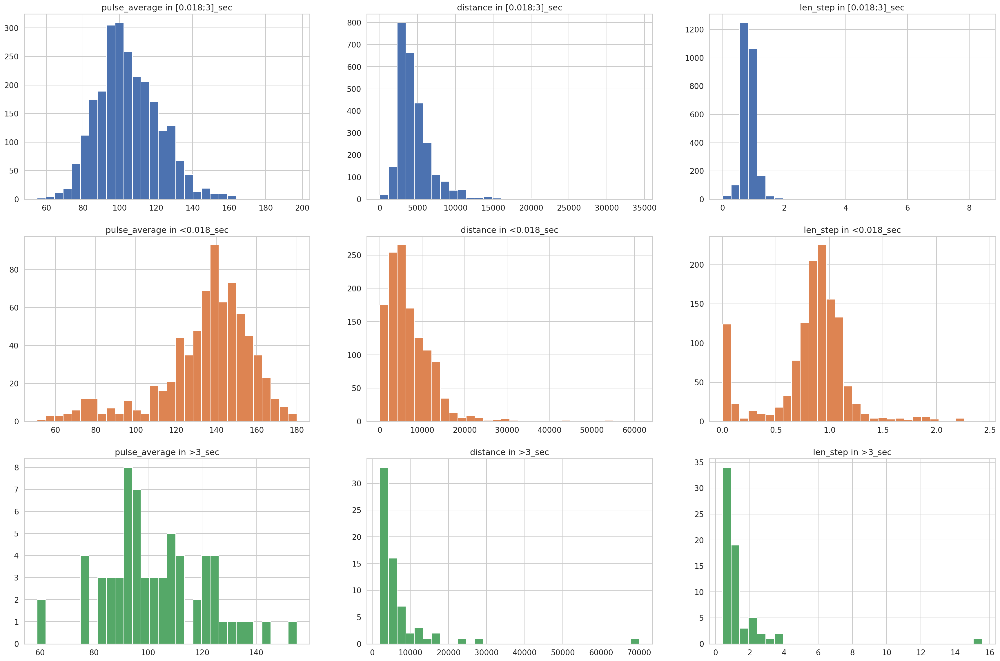

In [332]:
fig, ax = plt.subplots(len(time_coef_group_names_sec),len(list_diff_feature), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_diff_feature):
    for num_name, name in enumerate(time_coef_group_names_sec):
        data.loc[(True)&(data['time_coef_label_sec']== name)][feature].\
        hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ str(name))

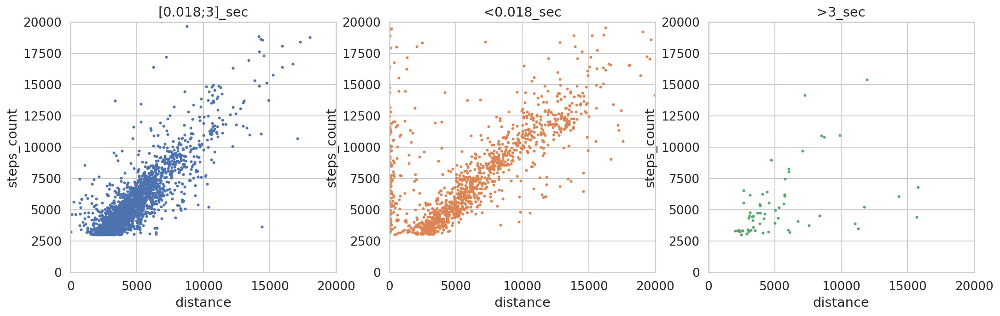

In [333]:
plt.rcParams["figure.figsize"]=(30, 5)
for num_name, name in enumerate(time_coef_group_names_sec):
    plt.subplot(1, 5, num_name+1)
    plt.scatter(data[data['time_coef_label_sec'] == name]['distance'],\
                data[data['time_coef_label_sec'] == name]['steps_count'],\
                s = 4, color =palette_sec[num_name])
    plt.title(name)
    plt.xlabel('distance')
    plt.ylabel('steps_count')
    plt.xlim([0,20000])
    plt.ylim([0,20000])

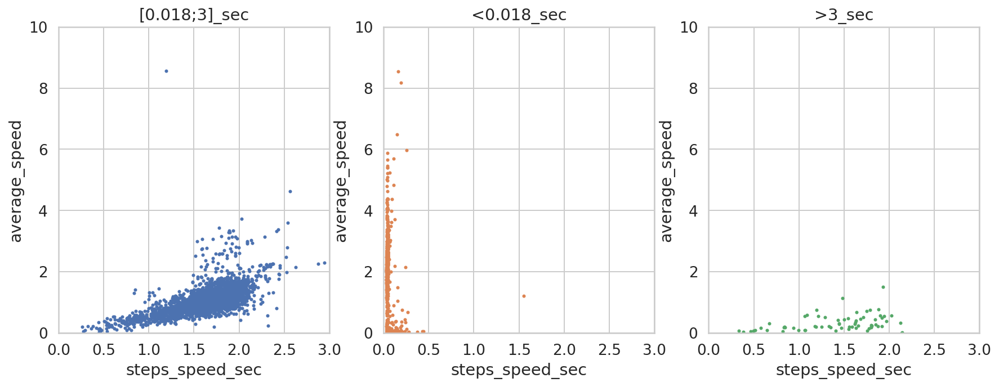

In [334]:
plt.rcParams["figure.figsize"]=(25, 5)
for num_name, name in enumerate(time_coef_group_names_sec):
    plt.subplot(1, 5, num_name+1)
    plt.scatter(data[data['time_coef_label_sec'] == name]['steps_speed_sec'],\
                data[data['time_coef_label_sec'] == name]['average_speed'],\
                s = 4, color =palette_sec[num_name])
    plt.title(name)
    plt.xlabel('steps_speed_sec')
    plt.ylabel('average_speed')
    plt.xlim([0,3])
    plt.ylim([0,10])

In [335]:
# Посчитаем средние по кластерам и восстановим данные, которых не хватает до непрерывных
# В данном случае, разници нет - коэффициент,с помощью которого кластеризировались данные 
# был посчитан при speed_test в шагах/мин или шагах/сек, те результаты от этого не изменятся

In [336]:
mean_coef_0_018_sec = data[data['time_coef_label_sec']=='<0.018_sec']['time_coef_sec'].mean()
mean_coef_0_018_3_sec = data[data['time_coef_label_sec']=='[0.018;3]_sec']['time_coef_sec'].mean()
mean_coef_3_sec = data[data['time_coef_label_sec']=='>3_sec']['time_coef_sec'].mean()
mean_coef_0_018_sec, mean_coef_0_018_3_sec, mean_coef_3_sec

(0.016640725591208293, 1.365780862010022, 38.426494679013835)

In [337]:

U_mean_0_018_sec = data[data['time_coef_label_sec']=='<0.018_sec']['average_speed'].mean()
U_mean_0_018_3_sec = data[data['time_coef_label_sec']=='[0.018;3]_sec']['average_speed'].mean()
U_mean_3_sec = data[data['time_coef_label_sec']=='>3_sec']['average_speed'].mean()
U_mean_0_018_sec, U_mean_0_018_3_sec, U_mean_3_sec

(2.0008619607843143, 1.09749146757679, 0.3197164179104477)

In [340]:
data['no_distance_flag'] = False
data.loc[(data['distance'].isin([np.nan])), 'no_distance_flag'] = True

In [341]:
#Пропущенные дистанции считаем как (mean_koef * average speed in grop * steps_count) / steps_speed_sec

In [342]:
data.loc[(data['distance'].isin([np.nan])) & (data['time_steps_sec']<10000), 'distance_restore_bef_1k'] =\
data.loc[(data['distance'].isin([np.nan])) & (data['time_steps_sec']<10000)]['steps_count']*1.36*1.095/\
data.loc[(data['distance'].isin([np.nan])) & (data['time_steps_sec']<10000)]['steps_speed_sec']

In [343]:
data.loc[(data['distance'].isin([np.nan])) & (data['time_steps_sec']>10000), 'distance_restore_after_1k'] =\
data.loc[(data['distance'].isin([np.nan])) & (data['time_steps_sec']>10000)]['steps_count']*0.016*2.00/\
data.loc[(data['distance'].isin([np.nan])) & (data['time_steps_sec']>10000)]['steps_speed_sec']

In [344]:
data.loc[~data['distance_restore_bef_1k'].isin([np.nan]), 'restore_distance'] = \
data.loc[~data['distance_restore_bef_1k'].isin([np.nan])]['distance_restore_bef_1k']

data.loc[~data['distance_restore_after_1k'].isin([np.nan]), 'restore_distance'] = \
data.loc[~data['distance_restore_after_1k'].isin([np.nan])]['distance_restore_after_1k']

In [347]:
data.loc[~data['distance'].isin([np.nan]), 'all_distance'] = \
data.loc[~data['distance'].isin([np.nan])]['distance']

data.loc[data['distance'].isin([np.nan]), 'all_distance'] = \
data.loc[data['distance'].isin([np.nan])]['restore_distance']

In [348]:
# Пропущенную скорость считаем как (dist * step_speed_sec) / steps_count

In [349]:
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps_sec']<10000), 'restore_average_speed'] =\
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps_sec']<10000)]['restore_distance']*\
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps_sec']<10000)]['steps_speed_sec']/\
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps_sec']<10000)]['steps_count']/1.36

In [350]:
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps_sec']>10000), 'restore_average_speed'] =\
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps_sec']>10000)]['restore_distance']*\
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps_sec']>10000)]['steps_speed_sec']/\
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps_sec']>10000)]['steps_count']/0.016

In [351]:
# Если дистанция существовала, считаем через нее

In [352]:
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps_sec']<10000) & \
         (~data['distance'].isin([np.nan])), 'restore_average_speed'] =\
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps_sec']<10000) & \
         (~data['distance'].isin([np.nan]))]['distance']*\
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps_sec']<10000) & \
         (~data['distance'].isin([np.nan]))]['steps_speed_sec']/\
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps_sec']<10000) & \
         (~data['distance'].isin([np.nan]))]['steps_count']/1.36

data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps_sec']>10000) & \
         (~data['distance'].isin([np.nan])), 'restore_average_speed'] =\
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps_sec']>10000) & \
         (~data['distance'].isin([np.nan]))]['distance']*\
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps_sec']>10000) & \
         (~data['distance'].isin([np.nan]))]['steps_speed_sec']/\
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps_sec']>10000) & \
         (~data['distance'].isin([np.nan]))]['steps_count']/0.016

In [353]:
data.loc[~data['average_speed'].isin([np.nan]), 'all_average_speed'] = \
data.loc[~data['average_speed'].isin([np.nan])]['average_speed']

data.loc[data['average_speed'].isin([np.nan]), 'all_average_speed'] = \
data.loc[data['average_speed'].isin([np.nan])]['restore_average_speed']

In [359]:
# Восстанавливаем время через дистанцию

In [360]:
data['all_time_distance'] = data['all_distance']/data['all_average_speed']

In [361]:
data['all_time_distance_hr'] = data['all_time_distance']/3600

In [369]:
# Восстанавливаем длинну шагов

In [370]:
data.loc[data['len_step'].isin([np.nan, np.inf]), 'restore_len_step'] = \
data.loc[data['len_step'].isin([np.nan, np.inf])]['all_distance']/\
data.loc[data['len_step'].isin([np.nan, np.inf])]['steps_count']

data.loc[~data['len_step'].isin([np.nan]), 'all_len_step'] = \
data.loc[~data['len_step'].isin([np.nan])]['len_step']
data.loc[data['len_step'].isin([np.nan]), 'all_len_step'] = \
data.loc[data['len_step'].isin([np.nan])]['restore_len_step']

In [372]:
data['distanse_from_len_step'] = data['steps_count']*data['all_len_step']

In [378]:
# Восстанавливаем ритм через скорость

In [379]:
data.loc[data['u_average_pace_m_s'].isin([np.nan]), 'restore_u_average_pace_m_s'] = \
data.loc[data['u_average_pace_m_s'].isin([np.nan])]['all_average_speed']

data.loc[~data['u_average_pace_m_s'].isin([np.nan]), 'all_u_average_pace_m_s'] = \
data.loc[~data['u_average_pace_m_s'].isin([np.nan])]['u_average_pace_m_s']
data.loc[data['u_average_pace_m_s'].isin([np.nan]), 'all_u_average_pace_m_s'] = \
data.loc[data['u_average_pace_m_s'].isin([np.nan])]['restore_u_average_pace_m_s']

In [380]:
# Восстанавливаем временной коэффициент

In [381]:
data['restore_time_coef_sec'] = data['restore_distance']/data['restore_average_speed']/data['time_steps_sec']

In [382]:
data.loc[data['restore_time_coef_sec'].isin([np.nan, np.inf]), 'restore_time_coef_sec'] = \
data.loc[data['restore_time_coef_sec'].isin([np.nan, np.inf])]['distance']/\
data.loc[data['restore_time_coef_sec'].isin([np.nan, np.inf])]['restore_average_speed']/\
data.loc[data['restore_time_coef_sec'].isin([np.nan, np.inf])]['time_steps_sec']

In [383]:
data.loc[~data['time_coef'].isin([np.nan]), 'all_time_coef_sec'] = \
data.loc[~data['time_coef'].isin([np.nan])]['time_coef_sec']
data.loc[data['time_coef'].isin([np.nan]), 'all_time_coef_sec'] = \
data.loc[data['time_coef'].isin([np.nan])]['restore_time_coef_sec']

In [384]:
# Новая сегментация с через восстановленный временной коэффициент

In [385]:
data.loc[(data['all_time_coef_sec']<0.018) & (True), 'all_time_coef_label_sec'] = '<0.018_sec'
data.loc[(data['all_time_coef_sec']>0.018) & (data['all_time_coef_sec']<3), 'all_time_coef_label_sec'] = '[0.018;3]_sec'
data.loc[(data['all_time_coef_sec']>3) & (True), 'all_time_coef_label_sec'] = '>3_sec'

In [393]:
all_time_coef_group_names_sec = data['all_time_coef_label_sec'].value_counts().index
all_palette_sec = sns.color_palette(None, len(all_time_coef_group_names_sec))

In [ ]:
print(len(data))
trash_data_2 = [24860, 88084, 92400]
data.drop(trash_data_2, axis=0, inplace=True)
print(len(data))

In [612]:
list_U_feature_all_sec = ['all_average_speed','all_u_average_pace_m_s', 'steps_speed_sec', 'mean_steps_per_second', 'pulse_average']

list_time_feature_all_sec = ['all_time_coef_sec', 'time_steps_sec', 'activity_time', 'all_time_distance',\
                             'steps_coef_sec', 'all_time_distance_hr','time_steps_hr_sec', 'workout_duration']

list_health_feature_all_sec = ['pulse_average', 'aerobic_cardio_zone', \
                               'anaerobic_cardio_zone', 'active_calories_burned', 'hf_time', 'run_time']

list_dist_feature_all_sec = ['all_distance', 'steps_count', 'distanse_from_len_step', 'all_len_step']

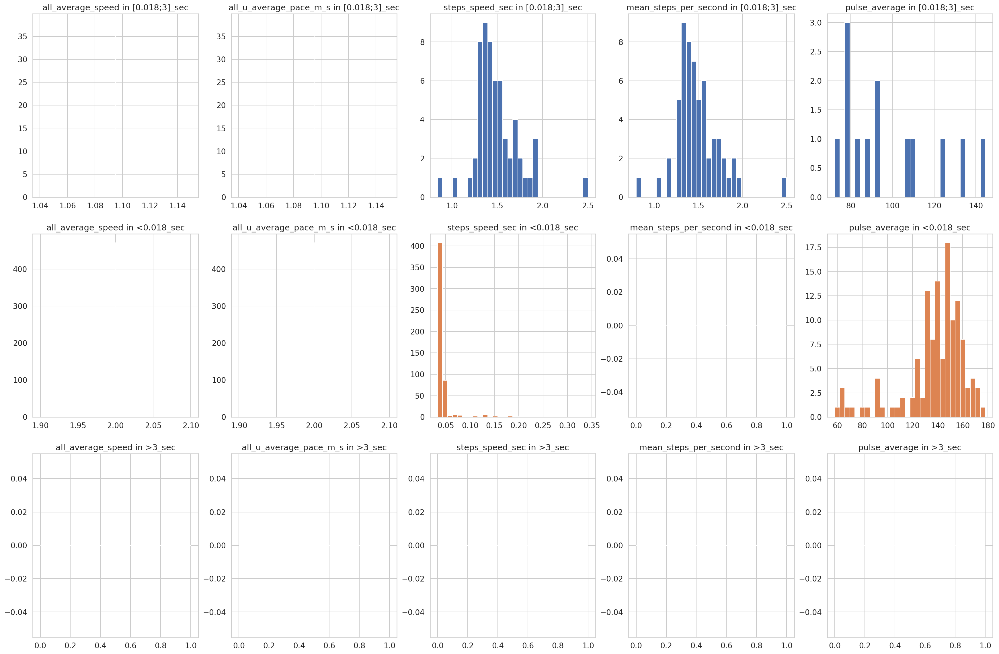

In [613]:
fig, ax = plt.subplots(len(all_time_coef_group_names_sec),len(list_U_feature_all_sec), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_U_feature_all_sec):
    for num_name, name in enumerate(all_time_coef_group_names_sec):
        data.loc[(data['no_distance_flag']==True)&(data['all_time_coef_label_sec']== name)][feature].\
        hist(color=all_palette_sec[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ name)

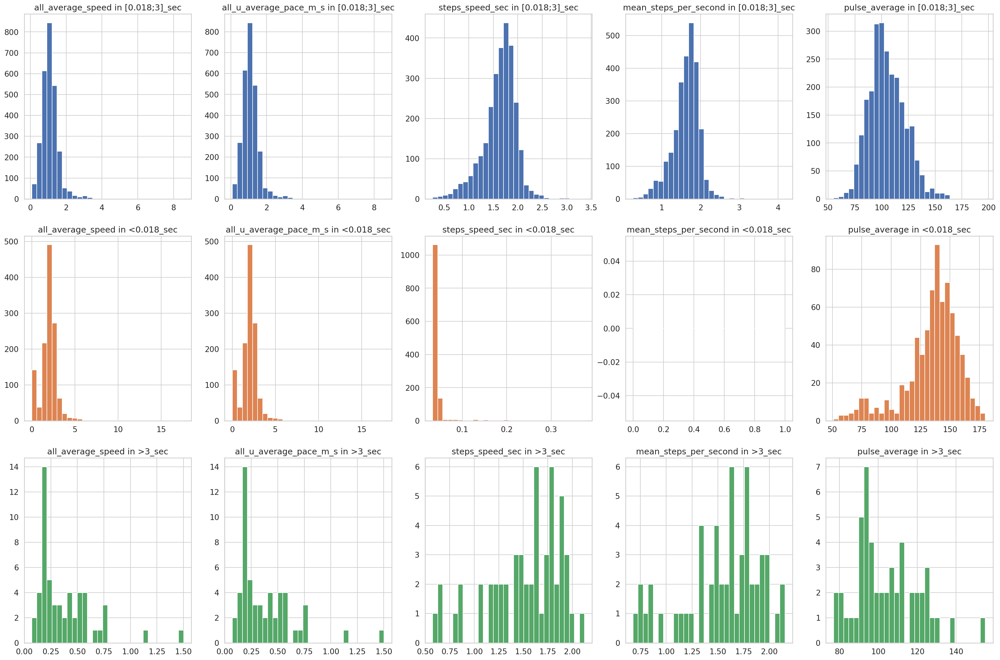

In [614]:
fig, ax = plt.subplots(len(all_time_coef_group_names_sec),len(list_U_feature_all_sec), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_U_feature_all_sec):
    for num_name, name in enumerate(all_time_coef_group_names_sec):
        data.loc[(data['no_distance_flag']==False)&(data['all_time_coef_label_sec']== name)][feature].\
        hist(color=all_palette_sec[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ name)

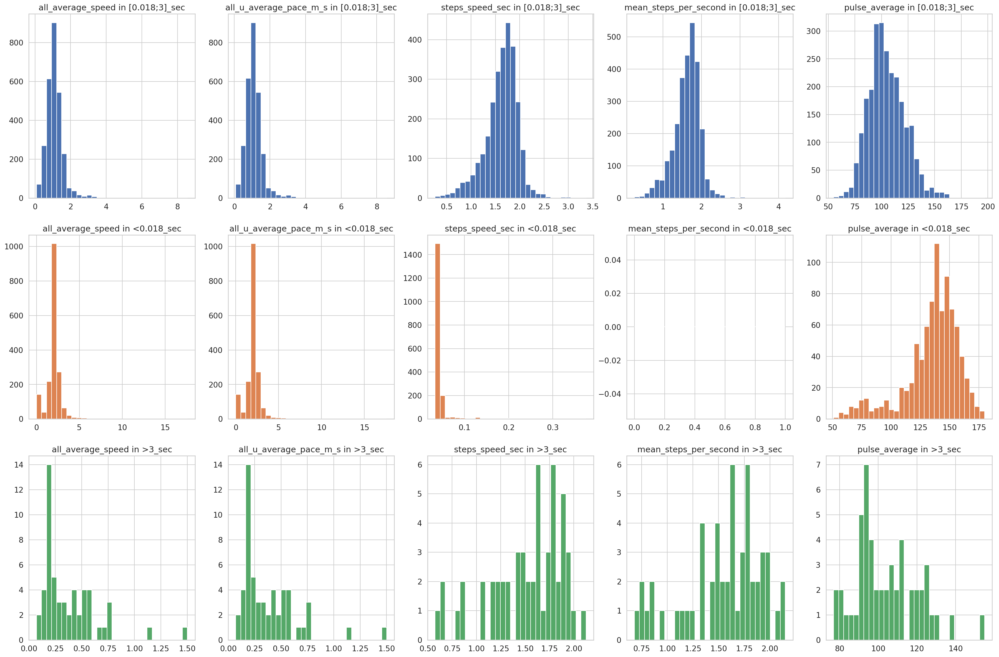

In [615]:
fig, ax = plt.subplots(len(all_time_coef_group_names_sec),len(list_U_feature_all_sec), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_U_feature_all_sec):
    for num_name, name in enumerate(all_time_coef_group_names_sec):
        data.loc[(True)&(data['all_time_coef_label_sec']== name)][feature].\
        hist(color=all_palette_sec[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ name)

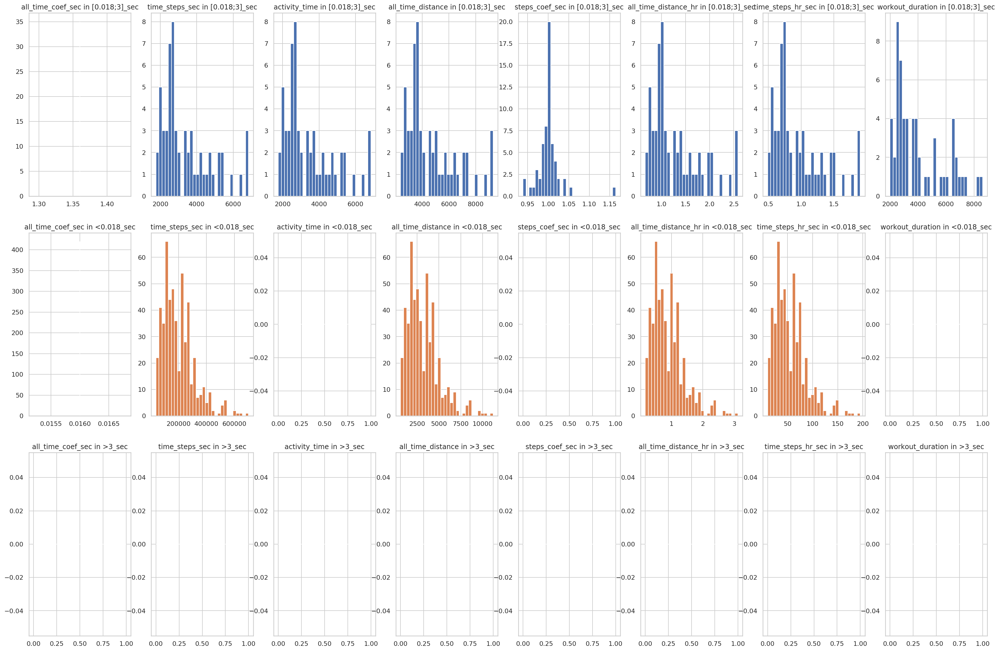

In [409]:
fig, ax = plt.subplots(len(all_time_coef_group_names_sec),len(list_time_feature_all_sec), figsize = (30,20))
sns.set_context("notebook", font_scale=1.0)

for num_feature, feature in enumerate(list_time_feature_all_sec):
    for num_name, name in enumerate(all_time_coef_group_names_sec):
        data.loc[(data['no_distance_flag']==True)&(data['all_time_coef_label_sec']== name)][feature].\
        hist(color=all_palette_sec[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ name)

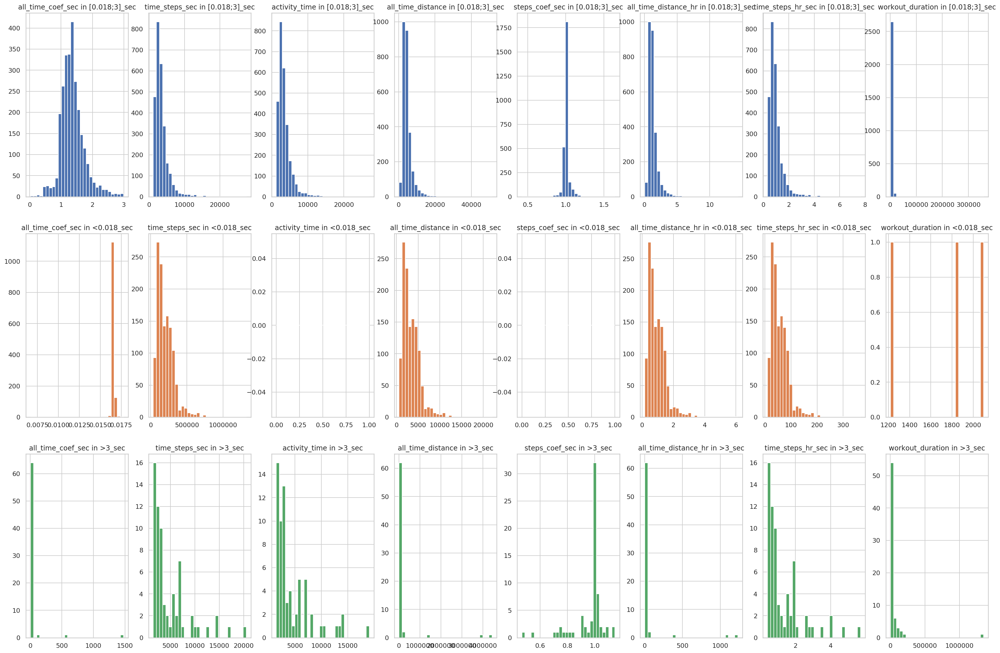

In [410]:
fig, ax = plt.subplots(len(all_time_coef_group_names_sec),len(list_time_feature_all_sec), figsize = (30,20))
sns.set_context("notebook", font_scale=1.0)

for num_feature, feature in enumerate(list_time_feature_all_sec):
    for num_name, name in enumerate(all_time_coef_group_names_sec):
        data.loc[(data['no_distance_flag']==False)&(data['all_time_coef_label_sec']== name)][feature].\
        hist(color=all_palette_sec[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ name)

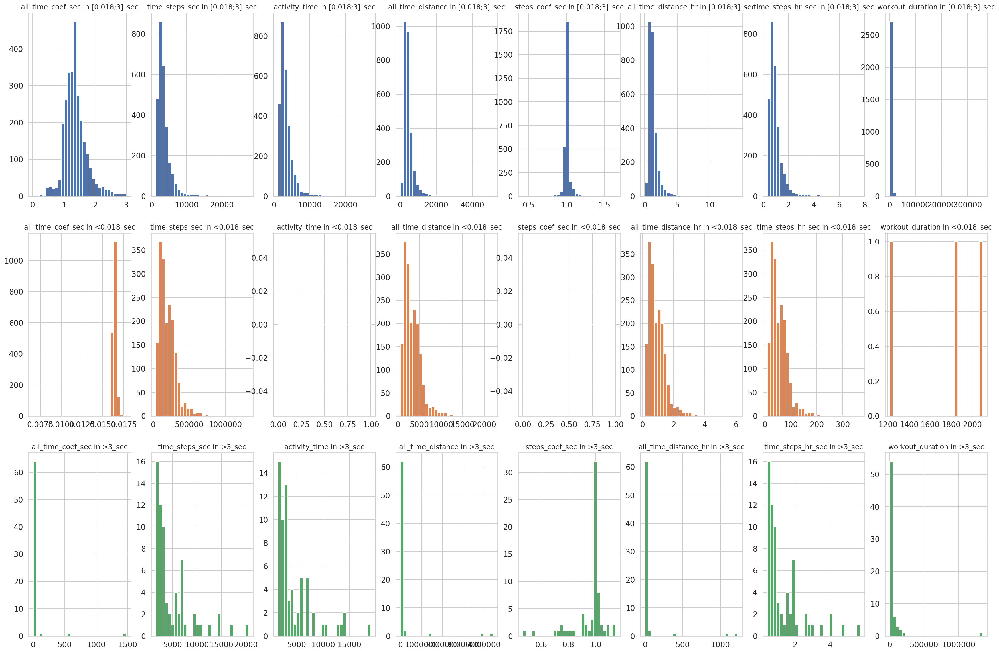

In [408]:
fig, ax = plt.subplots(len(all_time_coef_group_names_sec),len(list_time_feature_all_sec), figsize = (30,20))
sns.set_context("notebook", font_scale=1.0)

for num_feature, feature in enumerate(list_time_feature_all_sec):
    for num_name, name in enumerate(all_time_coef_group_names_sec):
        data.loc[(True)&(data['all_time_coef_label_sec']== name)][feature].\
        hist(color=all_palette_sec[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ name)

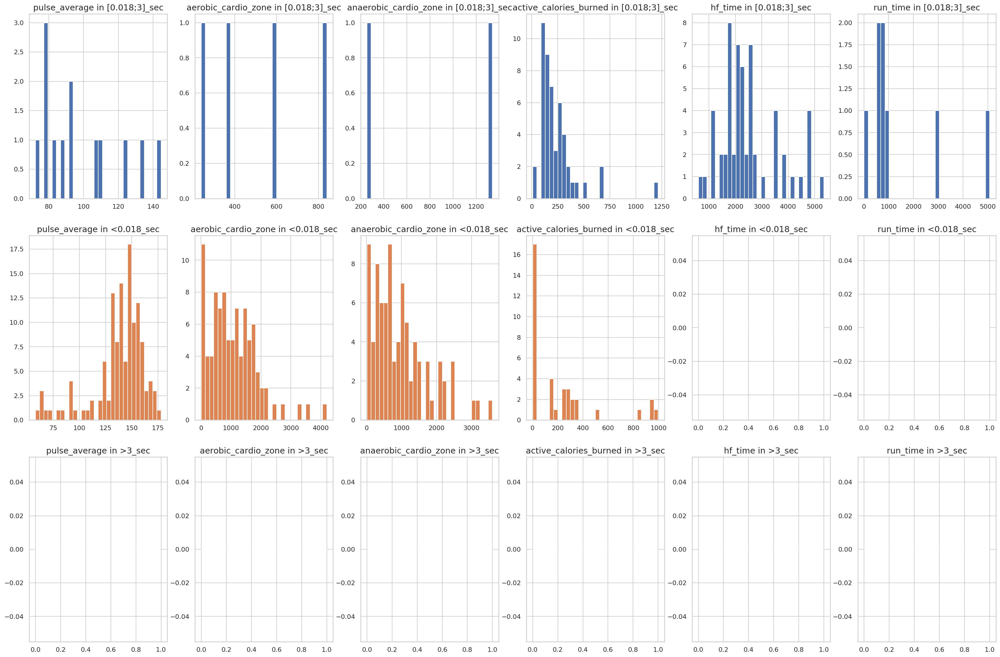

In [411]:
fig, ax = plt.subplots(len(all_time_coef_group_names_sec),len(list_health_feature_all_sec), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_health_feature_all_sec):
    for num_name, name in enumerate(all_time_coef_group_names_sec):
        data.loc[(data['no_distance_flag']==True)&(data['all_time_coef_label_sec']== name)][feature].\
        hist(color=all_palette_sec[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ name)

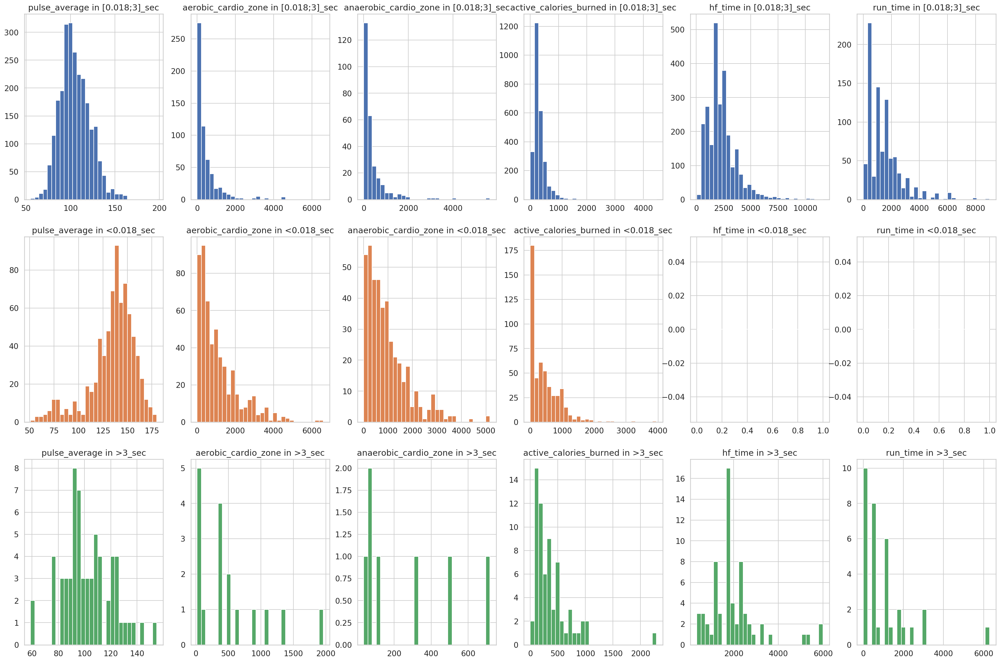

In [412]:
fig, ax = plt.subplots(len(all_time_coef_group_names_sec),len(list_health_feature_all_sec), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_health_feature_all_sec):
    for num_name, name in enumerate(all_time_coef_group_names_sec):
        data.loc[(data['no_distance_flag']==False)&(data['all_time_coef_label_sec']== name)][feature].\
        hist(color=all_palette_sec[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ name)

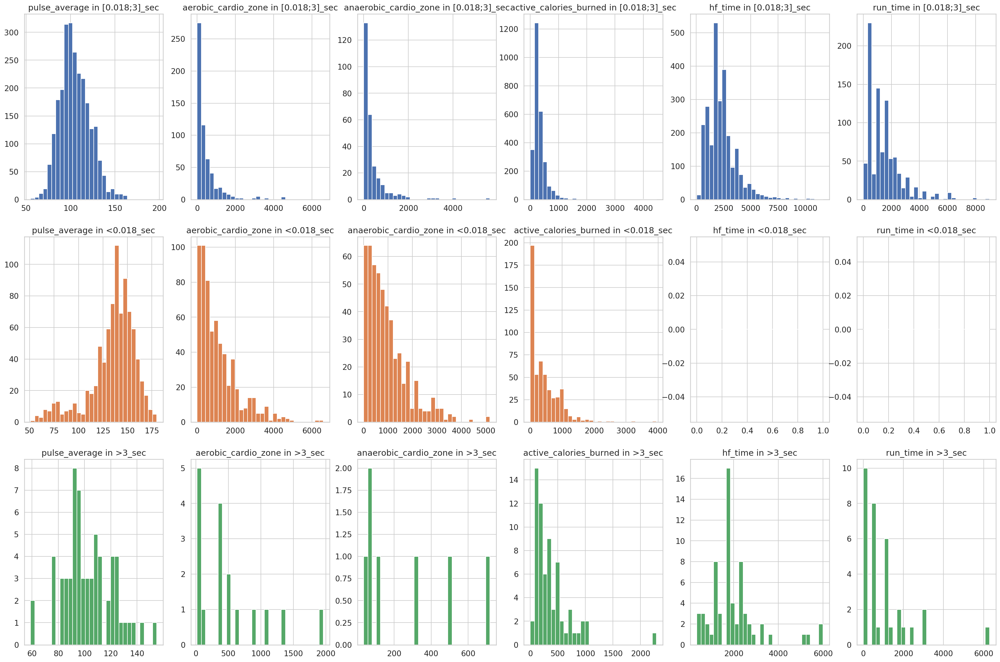

In [413]:
fig, ax = plt.subplots(len(all_time_coef_group_names_sec),len(list_health_feature_all_sec), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_health_feature_all_sec):
    for num_name, name in enumerate(all_time_coef_group_names_sec):
        data.loc[(True)&(data['all_time_coef_label_sec']== name)][feature].\
        hist(color=all_palette_sec[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ name)

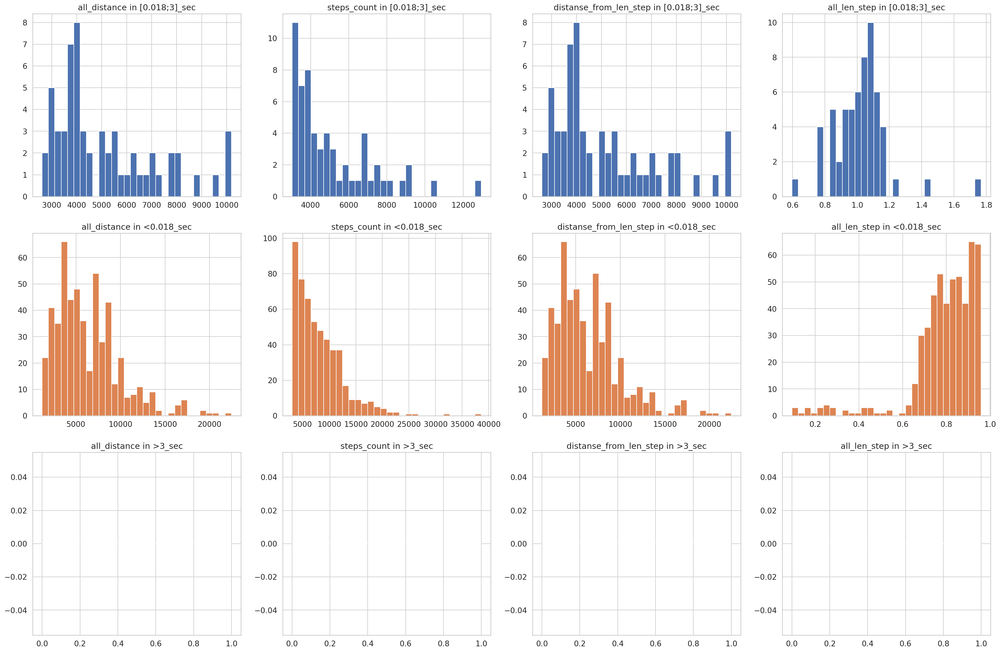

In [414]:
fig, ax = plt.subplots(len(all_time_coef_group_names_sec),len(list_dist_feature_all_sec), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_dist_feature_all_sec):
    for num_name, name in enumerate(all_time_coef_group_names_sec):
        data.loc[(data['no_distance_flag']==True)&(data['all_time_coef_label_sec']== name)][feature].\
        hist(color=all_palette_sec[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ name)

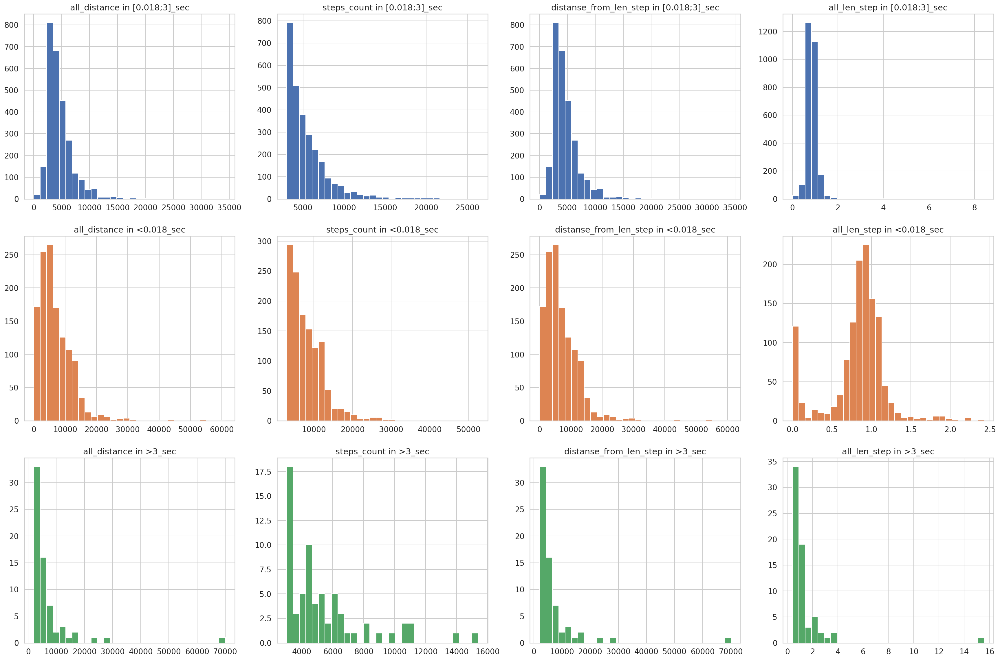

In [415]:
fig, ax = plt.subplots(len(all_time_coef_group_names_sec),len(list_dist_feature_all_sec), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_dist_feature_all_sec):
    for num_name, name in enumerate(all_time_coef_group_names_sec):
        data.loc[(data['no_distance_flag']==False)&(data['all_time_coef_label_sec']== name)][feature].\
        hist(color=all_palette_sec[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ name)

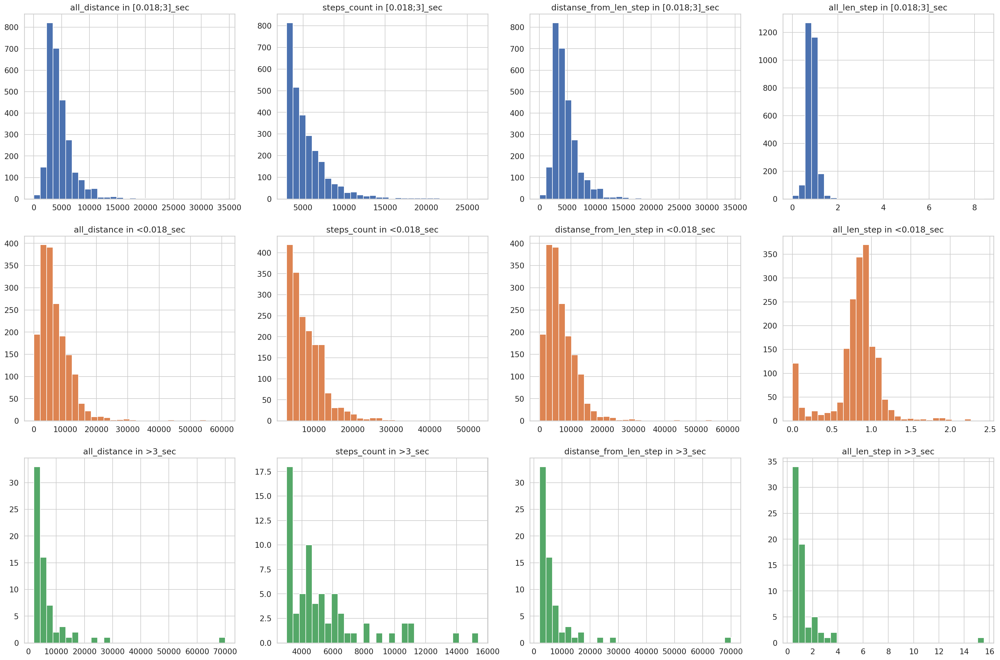

In [416]:
fig, ax = plt.subplots(len(all_time_coef_group_names_sec),len(list_dist_feature_all_sec), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_dist_feature_all_sec):
    for num_name, name in enumerate(all_time_coef_group_names_sec):
        data.loc[(True)&(data['all_time_coef_label_sec']== name)][feature].\
        hist(color=all_palette_sec[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ name)

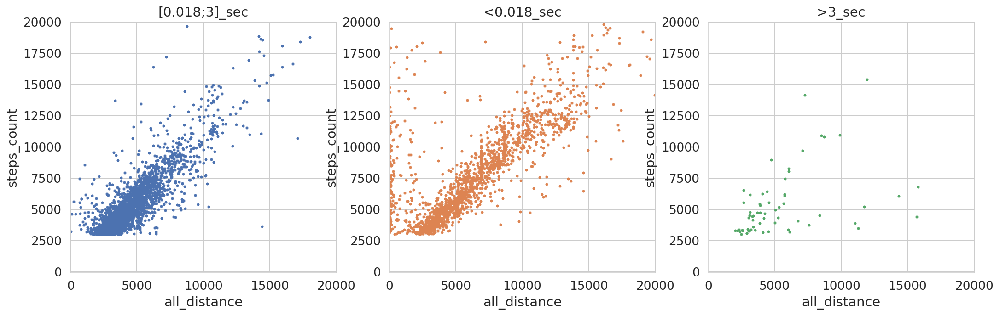

In [417]:
plt.rcParams["figure.figsize"]=(30, 5)
for num_name, name in enumerate(all_time_coef_group_names_sec):
    plt.subplot(1, 5, num_name+1)
    plt.scatter(data[data['all_time_coef_label_sec'] == name]['all_distance'],\
                data[data['all_time_coef_label_sec'] == name]['steps_count'],\
                s = 4, color =all_palette_sec[num_name])
    plt.title(name)
    plt.xlabel('all_distance')
    plt.ylabel('steps_count')
    plt.xlim([0,20000])
    plt.ylim([0,20000])

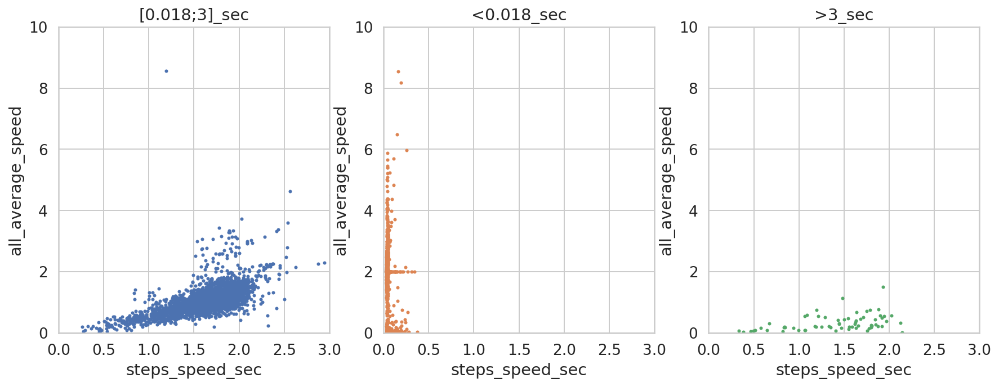

In [418]:
plt.rcParams["figure.figsize"]=(25, 5)
for num_name, name in enumerate(all_time_coef_group_names_sec):
    plt.subplot(1, 5, num_name+1)
    plt.scatter(data[data['all_time_coef_label_sec'] == name]['steps_speed_sec'],\
                data[data['all_time_coef_label_sec'] == name]['all_average_speed'],\
                s = 4, color =all_palette_sec[num_name])
    plt.title(name)
    plt.xlabel('steps_speed_sec')
    plt.ylabel('all_average_speed')
    plt.xlim([0,3])
    plt.ylim([0,10])

In [ ]:
# Вариант, если steps_speed в шагах в секунду

In [95]:
non_stop_columns_names = ['steps_count', 'steps_speed', 'all_distance', 'all_average_speed']

In [419]:
# k-mean (возьмем уже восстановленные скорости и дистанции для кластеризации)

In [420]:
scaler = StandardScaler()
X = scaler.fit_transform(data[non_stop_columns_names].values)

In [421]:
km = KMeans(n_clusters = 5)
data['cluster'] = km.fit_predict(X)

In [422]:
data['cluster'].value_counts()

1    2046
3    1039
2     899
0     603
4      55
Name: cluster, dtype: int64

In [423]:
all_cluster_label = data['cluster'].value_counts().index.values
all_cluster_palette = sns.color_palette(None, len(all_cluster_label))

In [424]:
# Посчитаем средние для новых кластеров и восстановим данные исходя из того, steps_speed в шагах в секунду

In [425]:
mean_time_coef = {}
mean_steps_coef = {}
mean_average_speed = {}
mean_steps_speed = {}
mean_time_steps = {}

for num_name, name in enumerate(all_cluster_label):
    mean_time_coef[num_name] = data.loc[data['cluster']== num_name]['time_coef'].mean()
    mean_steps_coef[num_name] = data.loc[data['cluster']== num_name]['steps_coef'].mean()
    mean_average_speed[num_name] = data.loc[data['cluster']== num_name]['average_speed'].mean()
    mean_steps_speed[num_name] = data.loc[data['cluster']== num_name]['steps_speed'].mean()
    mean_time_steps[num_name] = data.loc[data['cluster']== num_name]['time_steps'].mean()
print(mean_time_coef)  
print(mean_steps_coef)
print(mean_average_speed)
print(mean_steps_speed)
print(mean_time_steps)

{0: 7.26440859080796, 1: 131.2850560622643, 2: 120.01935352138828, 3: 0.999111391737527, 4: 193.16960400796017}
{0: 60.12543997096317, 1: 60.188831608144696, 2: 60.336817990976726, 3: nan, 4: 58.292836791610796}
{0: 2.3754508009153312, 1: 0.8595616089613036, 2: 1.4124703087885984, 3: 2.0304927113702647, 4: 3.3366595744680847}
{0: 6.934673300165839, 1: 86.36999462365583, 2: 108.48746718576216, 3: 2.503984600577481, 4: 14.893072727272733}
{0: 4725.181757691729, 1: 208.68917800205188, 2: 72.11339868967708, 3: 2338.708020605272, 4: 7876.866643024356}


In [426]:
d_mean = pd.DataFrame(data = [mean_time_steps, mean_time_coef, mean_average_speed, mean_steps_speed],\
                     index = ['mean_time_steps', 'mean_time_coef', 'mean_average_speed', 'mean_steps_speed'])

In [427]:
d_mean

,0,1,2,3,4
mean_time_steps,4725.181758,208.689178,72.113399,2338.708021,7876.866643
mean_time_coef,7.264409,131.285056,120.019354,0.999111,193.169604
mean_average_speed,2.375451,0.859562,1.412470,2.030493,3.336660
mean_steps_speed,6.934673,86.369995,108.487467,2.503985,14.893073


In [438]:
(131.28+120)/2

125.64

In [439]:
(0.86+1.41)/2

1.135

In [441]:
# Восстановим дистанцию по новым кластерам

In [442]:
# 1,2
data.loc[(data['distance'].isin([np.nan])) & (data['time_steps']<200), 'new_distance_restore'] =\
data.loc[(data['distance'].isin([np.nan])) & (data['time_steps']<200)]['steps_count']*125.64*1.13/\
data.loc[(data['distance'].isin([np.nan])) & (data['time_steps']<200)]['steps_speed']

In [443]:
# 3
data.loc[(data['distance'].isin([np.nan])) & (data['time_steps']>200) & (data['time_steps']<11700), \
'new_distance_restore'] =\
data.loc[(data['distance'].isin([np.nan])) & (data['time_steps']>200) & (data['time_steps']<11700)]\
['steps_count']*1*2.03/\
data.loc[(data['distance'].isin([np.nan])) & (data['time_steps']>200) & (data['time_steps']<11700)]\
['steps_speed']

In [444]:
# 0
data.loc[(data['distance'].isin([np.nan])) & (data['time_steps']>11700) & (data['time_steps']<40000), \
'new_distance_restore'] =\
data.loc[(data['distance'].isin([np.nan])) & (data['time_steps']>11700) & (data['time_steps']<40000)]\
['steps_count']*7.26*2.37/\
data.loc[(data['distance'].isin([np.nan])) & (data['time_steps']>11700) & (data['time_steps']<40000)]\
['steps_speed']

In [445]:
# 4
data.loc[(data['distance'].isin([np.nan])) & (data['time_steps']>40000), 'new_distance_restore'] =\
data.loc[(data['distance'].isin([np.nan])) & (data['time_steps']>40000)]['steps_count']*193.16*3.33/\
data.loc[(data['distance'].isin([np.nan])) & (data['time_steps']>40000)]['steps_speed']

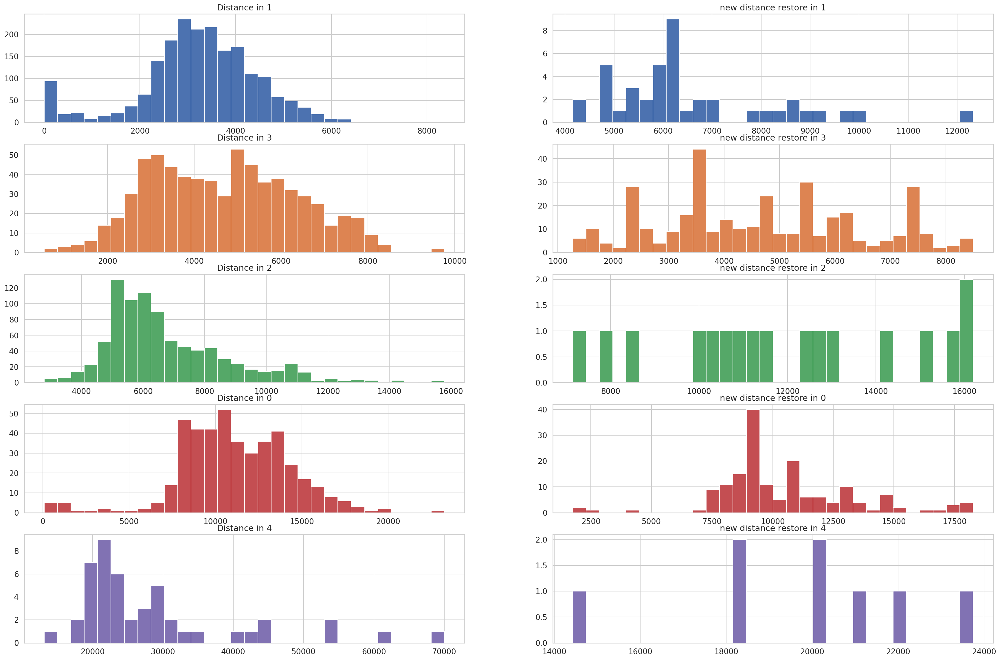

In [446]:
fig, ax = plt.subplots(len(all_cluster_label),2, figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_name, name in enumerate(all_cluster_label):
    data.loc[(data['no_distance_flag']==False)&(data['cluster']== name)]['distance'].\
    hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name,0])
    ax[num_name,0].set_title('Distance in '+ str(name))
for num_name, name in enumerate(all_cluster_label):
    data.loc[(data['no_distance_flag']==True)&(data['cluster']== name)]['new_distance_restore'].\
    hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name,1])
    ax[num_name,1].set_title('new distance restore in '+ str(name))

In [447]:
# Восстановим скорость по новым кластерам

In [448]:
# 1,2
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps']<200) & \
         (~data['distance'].isin([np.nan])), 'new_average_speed_restore'] =\
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps']<200) & \
         (~data['distance'].isin([np.nan]))]['distance']*\
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps']<200) & \
         (~data['distance'].isin([np.nan]))]['steps_speed']/\
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps']<200) & \
         (~data['distance'].isin([np.nan]))]['steps_count']/125.64

# 3
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps']>200) & \
         (data['time_steps']<11700) &\
         (~data['distance'].isin([np.nan])), 'new_average_speed_restore'] =\
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps']>200) & \
         (data['time_steps']<11700) &\
         (~data['distance'].isin([np.nan]))]['distance']*\
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps']>200) & \
         (data['time_steps']<11700) &\
         (~data['distance'].isin([np.nan]))]['steps_speed']/\
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps']>200) & \
         (data['time_steps']<11700) &\
         (~data['distance'].isin([np.nan]))]['steps_count']/1

# 0
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps']>11700) & \
         (data['time_steps']<40000) &\
         (~data['distance'].isin([np.nan])), 'new_average_speed_restore'] =\
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps']>11700) & \
         (data['time_steps']<40000) &\
         (~data['distance'].isin([np.nan]))]['distance']*\
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps']>11700) & \
         (data['time_steps']<40000) &\
         (~data['distance'].isin([np.nan]))]['steps_speed']/\
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps']>11700) & \
         (data['time_steps']<40000) &\
         (~data['distance'].isin([np.nan]))]['steps_count']/7.26

# 4
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps']>40000) &\
         (~data['distance'].isin([np.nan])), 'new_average_speed_restore'] =\
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps']>40000) &\
         (~data['distance'].isin([np.nan]))]['distance']*\
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps']>40000) &\
         (~data['distance'].isin([np.nan]))]['steps_speed']/\
data.loc[(data['average_speed'].isin([np.nan])) & \
         (data['time_steps']>40000) &\
         (~data['distance'].isin([np.nan]))]['steps_count']/193.16

In [451]:
data.loc[~data['distance'].isin([np.nan]), 'new_all_distance'] = \
data.loc[~data['distance'].isin([np.nan])]['distance']

data.loc[data['distance'].isin([np.nan]), 'new_all_distance'] = \
data.loc[data['distance'].isin([np.nan])]['new_distance_restore']

In [455]:
# 1,2
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps']<200), 'new_average_speed_restore'] =\
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps']<200)]['new_all_distance']*\
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps']<200)]['steps_speed']/\
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps']<200)]['steps_count']/125.64
# 3
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps']>200) & (data['time_steps']<11700), 'new_average_speed_restore'] =\
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps']>200) & (data['time_steps']<11700)]['new_all_distance']*\
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps']>200) & (data['time_steps']<11700)]['steps_speed']/\
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps']>200) & (data['time_steps']<11700)]['steps_count']/1
# 0
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps']>11700) & (data['time_steps']<40000), 'new_average_speed_restore'] =\
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps']>11700) & (data['time_steps']<40000)]['new_all_distance']*\
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps']>11700) & (data['time_steps']<40000)]['steps_speed']/\
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps']>11700) & (data['time_steps']<40000)]['steps_count']/7.26
# 4
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps']>40000), 'new_average_speed_restore'] =\
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps']>40000)]['new_all_distance']*\
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps']>40000)]['steps_speed']/\
data.loc[(data['average_speed'].isin([np.nan])) & (data['time_steps']>40000)]['steps_count']/193.16

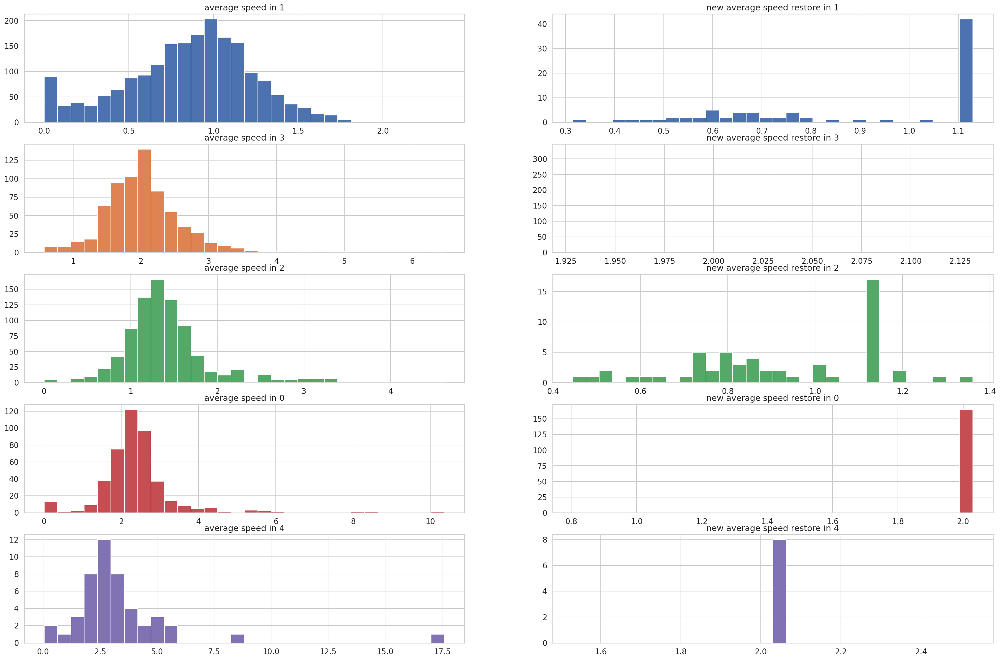

In [465]:
fig, ax = plt.subplots(len(all_cluster_label),2, figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_name, name in enumerate(all_cluster_label):
    data.loc[(~data['average_speed'].isin([np.nan]))&(data['cluster']== name)]['average_speed'].\
    hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name,0])
    ax[num_name,0].set_title('average speed in '+ str(name))
for num_name, name in enumerate(all_cluster_label):
    data.loc[(data['average_speed'].isin([np.nan]))&(data['cluster']== name)]['new_average_speed_restore'].\
    hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name,1])
    ax[num_name,1].set_title('new average speed restore in '+ str(name))

In [466]:
data.loc[~data['average_speed'].isin([np.nan]), 'new_all_average_speed'] = \
data.loc[~data['average_speed'].isin([np.nan])]['average_speed']

data.loc[data['average_speed'].isin([np.nan]), 'new_all_average_speed'] = \
data.loc[data['average_speed'].isin([np.nan])]['new_average_speed_restore']

In [ ]:
# Восстановим остальные показатели по новым кластерам

In [467]:
data['new_all_time_distance'] = data['new_all_distance']/data['new_all_average_speed']

In [468]:
data['new_all_time_distance_hr'] = data['new_all_time_distance']/3600
data['time_steps_hr'] = data['time_steps']/3600

data['average_pace_s_m'] = data['average_pace']*60/1000
data['u_average_pace_m_s'] = 1/data['average_pace_s_m']

In [469]:
data['new_restore_time_coef'] = data['new_distance_restore']/data['new_average_speed_restore']/data['time_steps']

In [471]:
data.loc[data['new_restore_time_coef'].isin([np.nan, np.inf]), 'new_restore_time_coef'] = \
data.loc[data['new_restore_time_coef'].isin([np.nan, np.inf])]['distance']/\
data.loc[data['new_restore_time_coef'].isin([np.nan, np.inf])]['new_average_speed_restore']/\
data.loc[data['new_restore_time_coef'].isin([np.nan, np.inf])]['time_steps']

In [473]:
data.loc[~data['time_coef'].isin([np.nan]), 'new_all_restore_time_coef'] = \
data.loc[~data['time_coef'].isin([np.nan])]['time_coef']
data.loc[data['time_coef'].isin([np.nan]), 'new_all_restore_time_coef'] = \
data.loc[data['time_coef'].isin([np.nan])]['new_restore_time_coef']

In [476]:
data.loc[data['len_step'].isin([np.nan, np.inf]), 'new_restore_len_step'] = \
data.loc[data['len_step'].isin([np.nan, np.inf])]['new_all_distance']/\
data.loc[data['len_step'].isin([np.nan, np.inf])]['steps_count']

data.loc[~data['len_step'].isin([np.nan]), 'new_all_len_step'] = \
data.loc[~data['len_step'].isin([np.nan])]['len_step']
data.loc[data['len_step'].isin([np.nan]), 'new_all_len_step'] = \
data.loc[data['len_step'].isin([np.nan])]['new_restore_len_step']

In [477]:
data['new_distanse_from_len_step'] = data['steps_count']*data['new_all_len_step']

In [482]:
data.loc[data['u_average_pace_m_s'].isin([np.nan]), 'new_restore_u_average_pace_m_s'] = \
data.loc[data['u_average_pace_m_s'].isin([np.nan])]['new_average_speed_restore']

data.loc[~data['u_average_pace_m_s'].isin([np.nan]), 'new_all_u_average_pace_m_s'] = \
data.loc[~data['u_average_pace_m_s'].isin([np.nan])]['u_average_pace_m_s']
data.loc[data['u_average_pace_m_s'].isin([np.nan]), 'new_all_u_average_pace_m_s'] = \
data.loc[data['u_average_pace_m_s'].isin([np.nan])]['new_restore_u_average_pace_m_s']

In [489]:
data['true_mean_step_per_sec'] = data['mean_steps_per_second']*60 # I hope) 

In [492]:
data.loc[~(data['true_mean_step_per_sec'].isin([np.nan]))]['true_mean_step_per_sec']

activity_id
1090     110.16
1093     107.04
1104     119.10
1176      99.30
1183     115.02
          ...  
99873    107.22
99888     86.34
99890    123.12
99924    107.40
99933    102.96
Name: true_mean_step_per_sec, Length: 2844, dtype: float64

In [493]:
data.loc[(data['true_mean_step_per_sec'].isin([np.nan])), 'restore_true_mean_step_per_sec' ] = \
data.loc[data['true_mean_step_per_sec'].isin([np.nan])]['steps_speed']

In [494]:
data.loc[~data['true_mean_step_per_sec'].isin([np.nan]), 'new_true_mean_step_per_sec'] = \
data.loc[~data['true_mean_step_per_sec'].isin([np.nan])]['true_mean_step_per_sec']
data.loc[data['true_mean_step_per_sec'].isin([np.nan]), 'new_true_mean_step_per_sec'] = \
data.loc[data['true_mean_step_per_sec'].isin([np.nan])]['restore_true_mean_step_per_sec']

In [549]:
list_U_feature_all = ['new_all_average_speed','new_all_u_average_pace_m_s', 'steps_speed',\
                      'new_true_mean_step_per_sec']

list_time_feature_all = ['time_steps', 'new_all_time_distance',\
                             'new_all_time_distance_hr','time_steps_hr']

list_health_feature_all = ['pulse_average', 'aerobic_cardio_zone', \
                               'anaerobic_cardio_zone', 'active_calories_burned', 'hf_time', 'run_time']

list_dist_feature_all = ['new_all_distance', 'steps_count', 'new_distanse_from_len_step',\
                         'new_all_len_step']

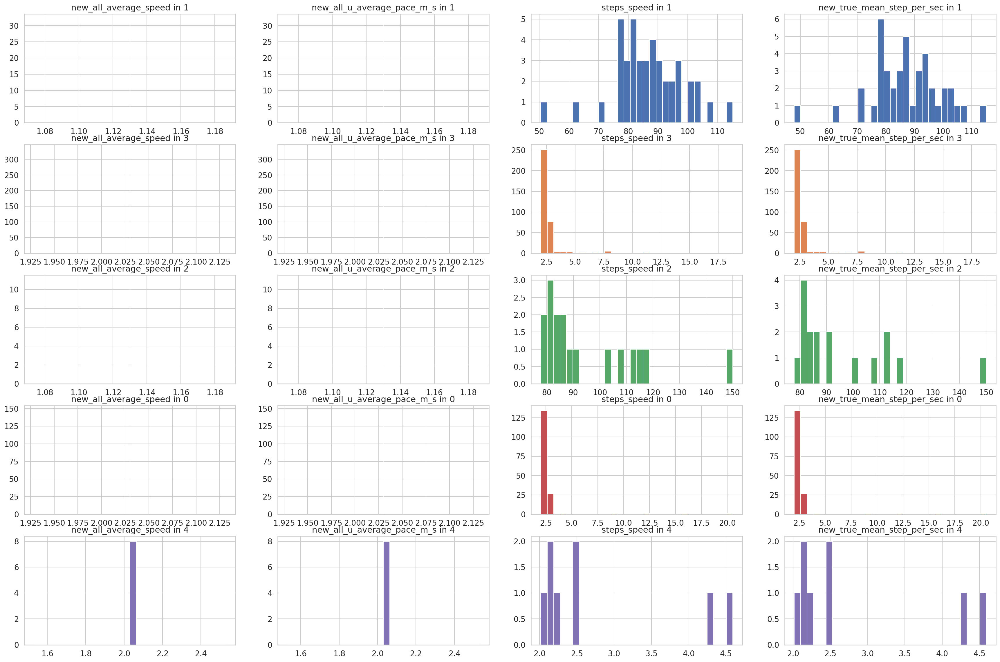

In [498]:
fig, ax = plt.subplots(len(all_cluster_label),len(list_U_feature_all), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_U_feature_all):
    for num_name, name in enumerate(all_cluster_label):
        data.loc[(data['no_distance_flag']==True)&(data['cluster']== name)][feature].\
        hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ str(name))

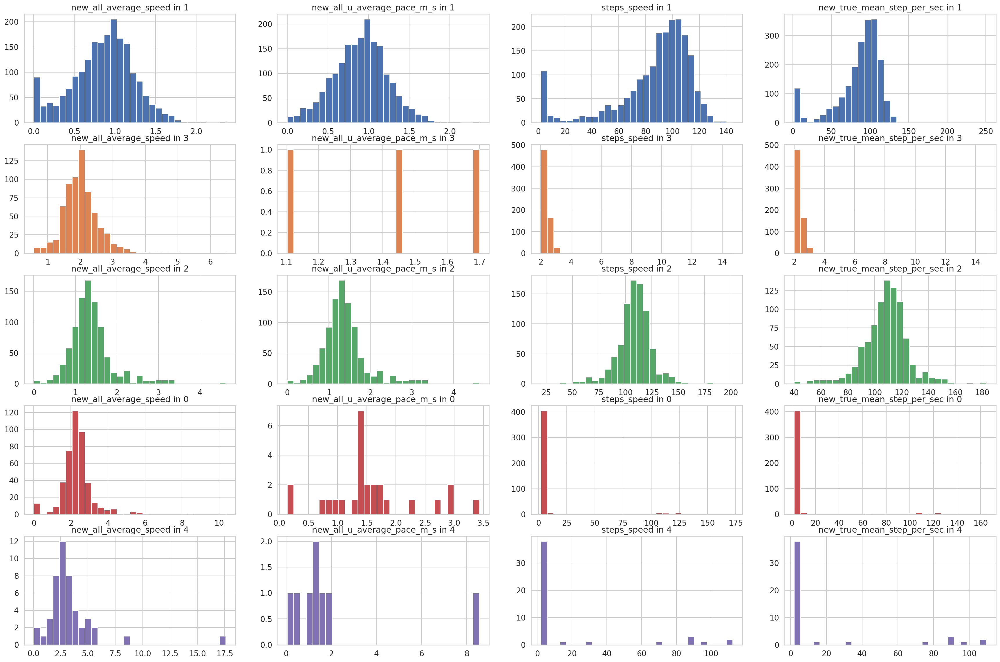

In [499]:
fig, ax = plt.subplots(len(all_cluster_label),len(list_U_feature_all), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_U_feature_all):
    for num_name, name in enumerate(all_cluster_label):
        data.loc[(data['no_distance_flag']==False)&(data['cluster']== name)][feature].\
        hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ str(name))

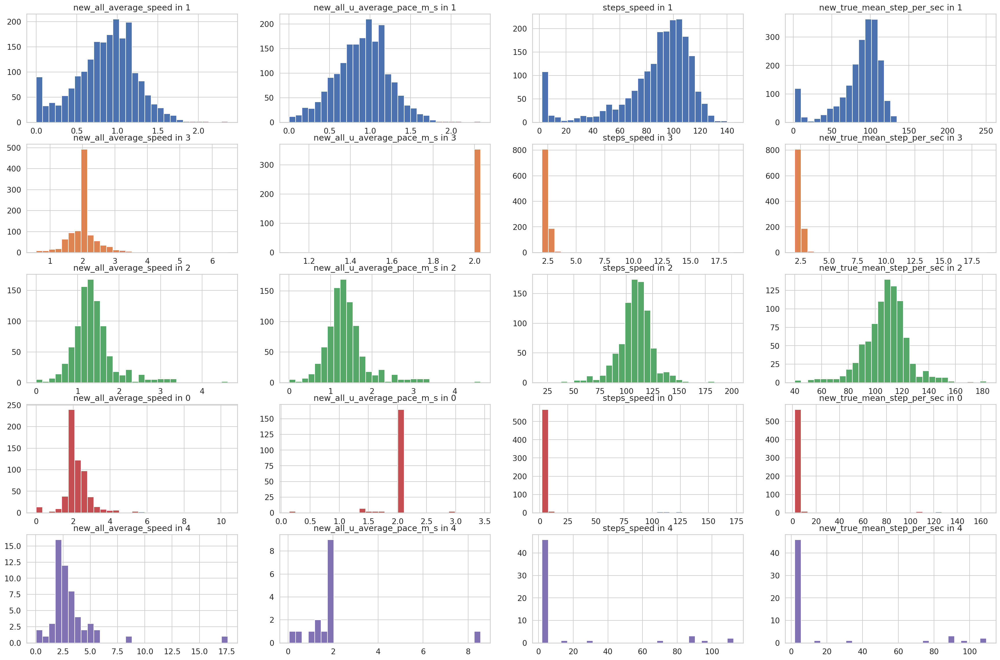

In [500]:
fig, ax = plt.subplots(len(all_cluster_label),len(list_U_feature_all), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_U_feature_all):
    for num_name, name in enumerate(all_cluster_label):
        data.loc[(True)&(data['cluster']== name)][feature].\
        hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ str(name))

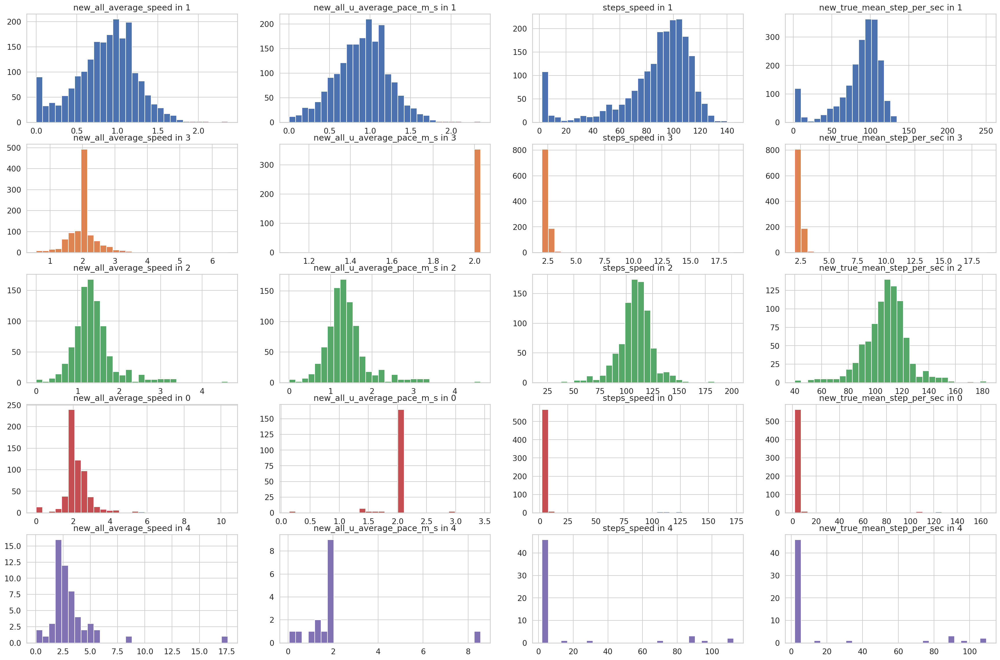

In [501]:
fig, ax = plt.subplots(len(all_cluster_label),len(list_U_feature_all), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_U_feature_all):
    for num_name, name in enumerate(all_cluster_label):
        data.loc[(True)&(data['cluster']== name)][feature].\
        hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ str(name))

In [502]:
trash_data_3 = [26584, 78602, 13378, 26616]
data.drop(trash_data_3, axis=0, inplace=True)
len(data)

4638

In [503]:
trash_data_4 = [13822,59987, 15284, 85500, 18658, 68086, 14657, 50937,\
           21684, 5668, 57717, 76520, 3968, 3883, 75146, 52287]
data.drop(trash_data_4, axis=0, inplace=True)
len(data)

4621

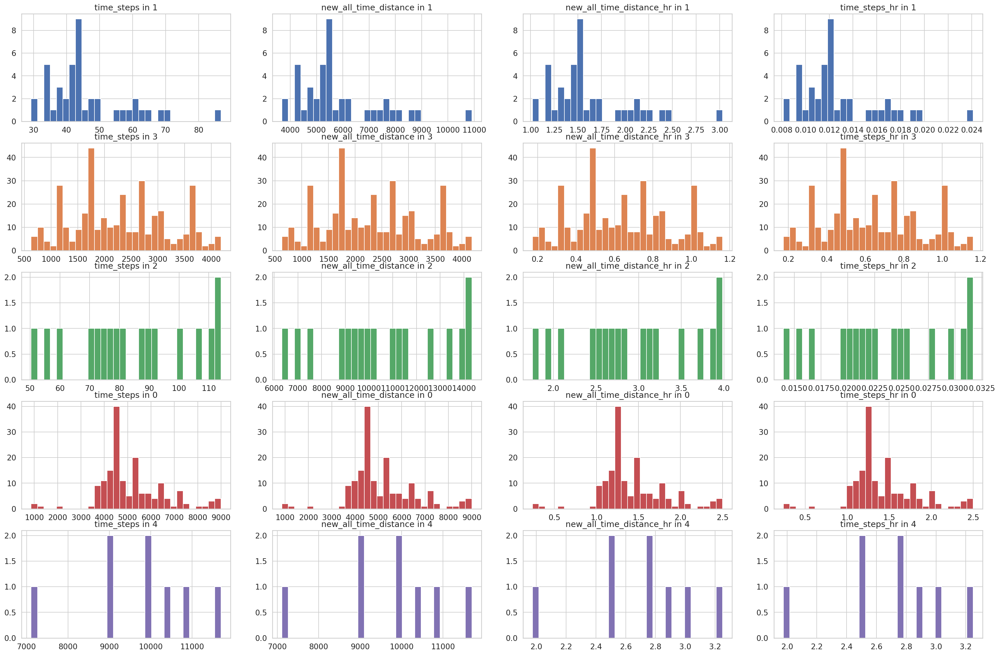

In [516]:
fig, ax = plt.subplots(len(all_cluster_label),len(list_time_feature_all), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_time_feature_all):
    for num_name, name in enumerate(all_cluster_label):
        data.loc[(data['no_distance_flag']==True)&(data['cluster']== name)][feature].\
        hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ str(name))

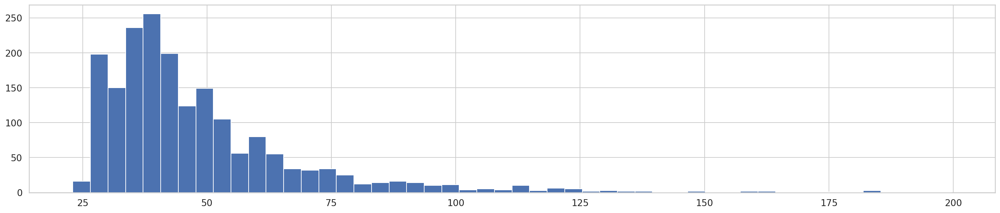

In [517]:
data.loc[(data['cluster']==1)&(data['time_steps']<200)]['time_steps'].hist(bins=50)

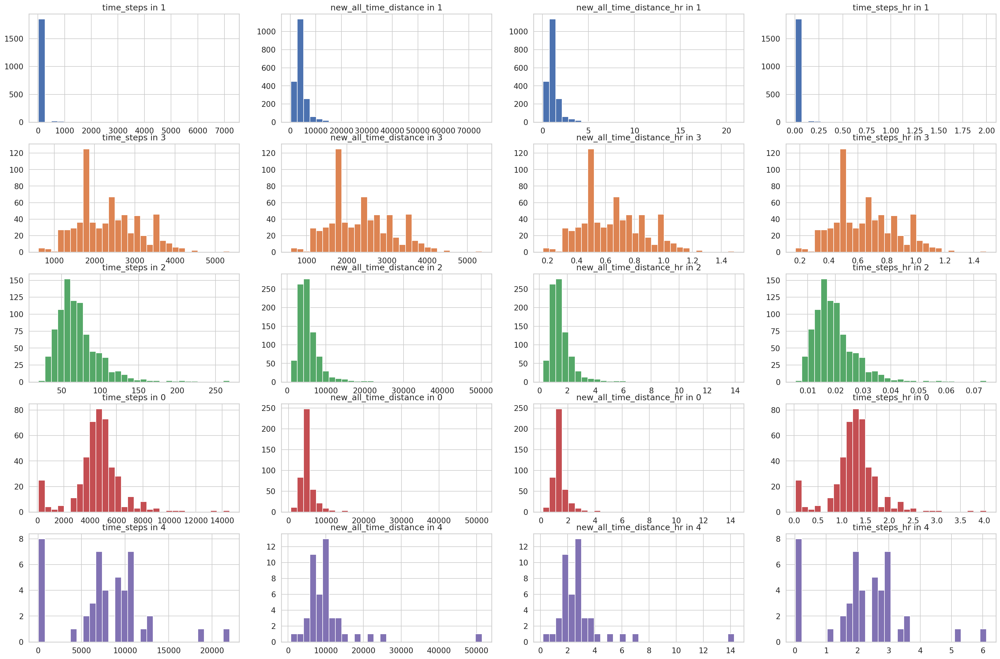

In [518]:
fig, ax = plt.subplots(len(all_cluster_label),len(list_time_feature_all), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_time_feature_all):
    for num_name, name in enumerate(all_cluster_label):
        data.loc[(data['no_distance_flag']==False)&(data['cluster']== name)][feature].\
        hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ str(name))

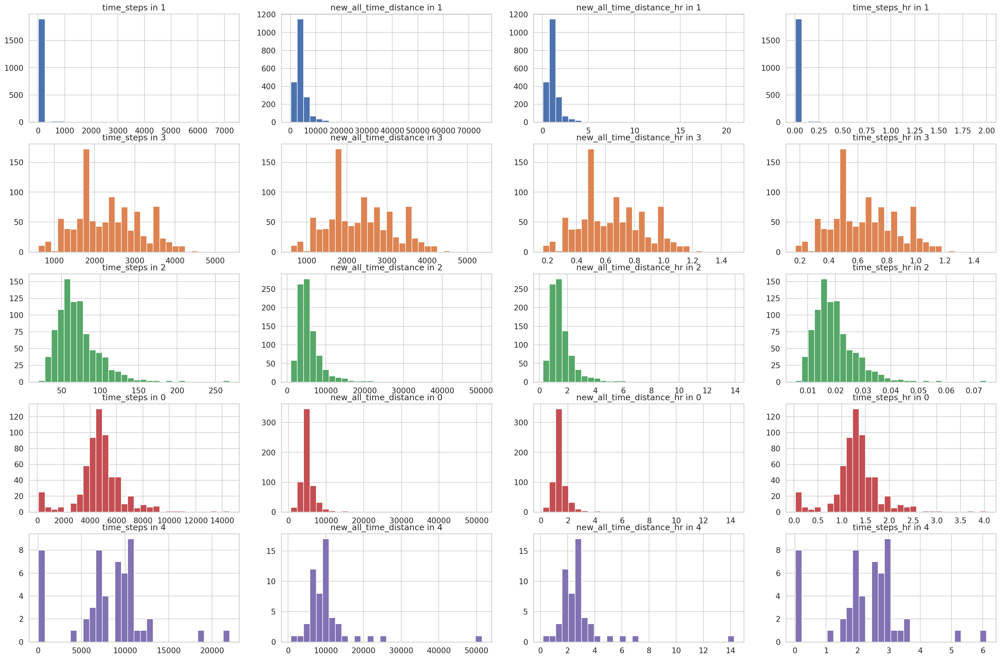

In [519]:
fig, ax = plt.subplots(len(all_cluster_label),len(list_time_feature_all), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_time_feature_all):
    for num_name, name in enumerate(all_cluster_label):
        data.loc[(True)&(data['cluster']== name)][feature].\
        hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ str(name))

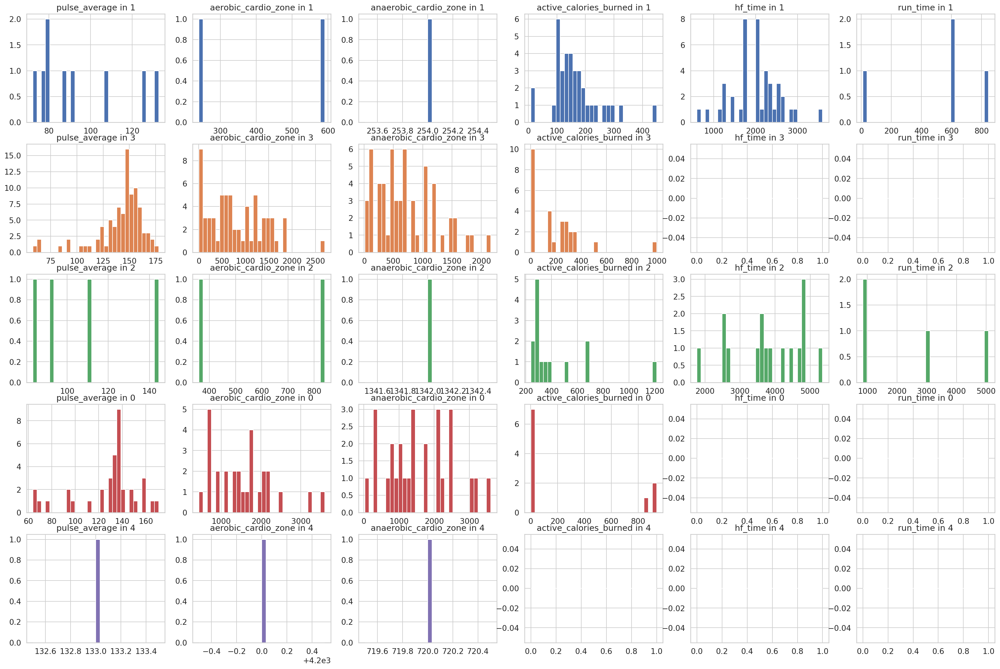

In [520]:
fig, ax = plt.subplots(len(all_cluster_label),len(list_health_feature_all), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_health_feature_all):
    for num_name, name in enumerate(all_cluster_label):
        data.loc[(data['no_distance_flag']==True)&(data['cluster']== name)][feature].\
        hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ str(name))

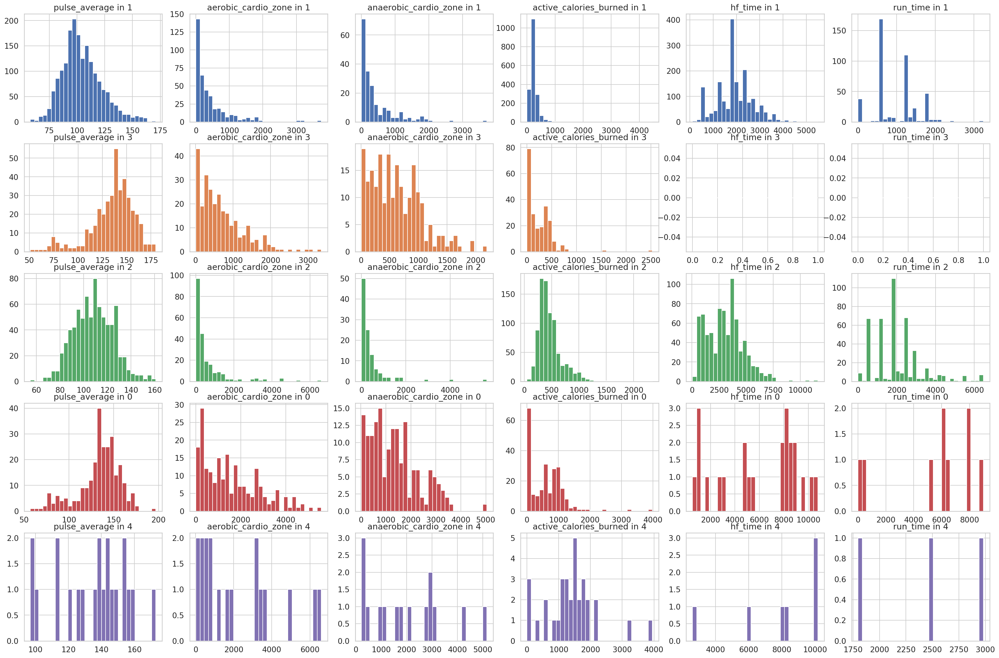

In [521]:
fig, ax = plt.subplots(len(all_cluster_label),len(list_health_feature_all), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_health_feature_all):
    for num_name, name in enumerate(all_cluster_label):
        data.loc[(data['no_distance_flag']==False)&(data['cluster']== name)][feature].\
        hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ str(name))

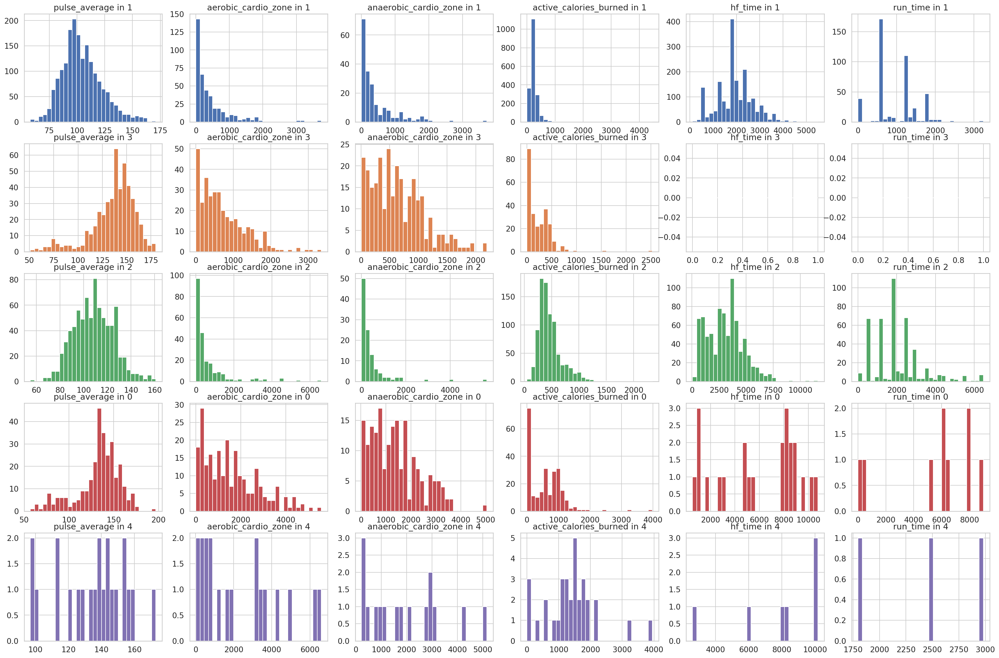

In [522]:
fig, ax = plt.subplots(len(all_cluster_label),len(list_health_feature_all), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_health_feature_all):
    for num_name, name in enumerate(all_cluster_label):
        data.loc[(True)&(data['cluster']== name)][feature].\
        hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ str(name))

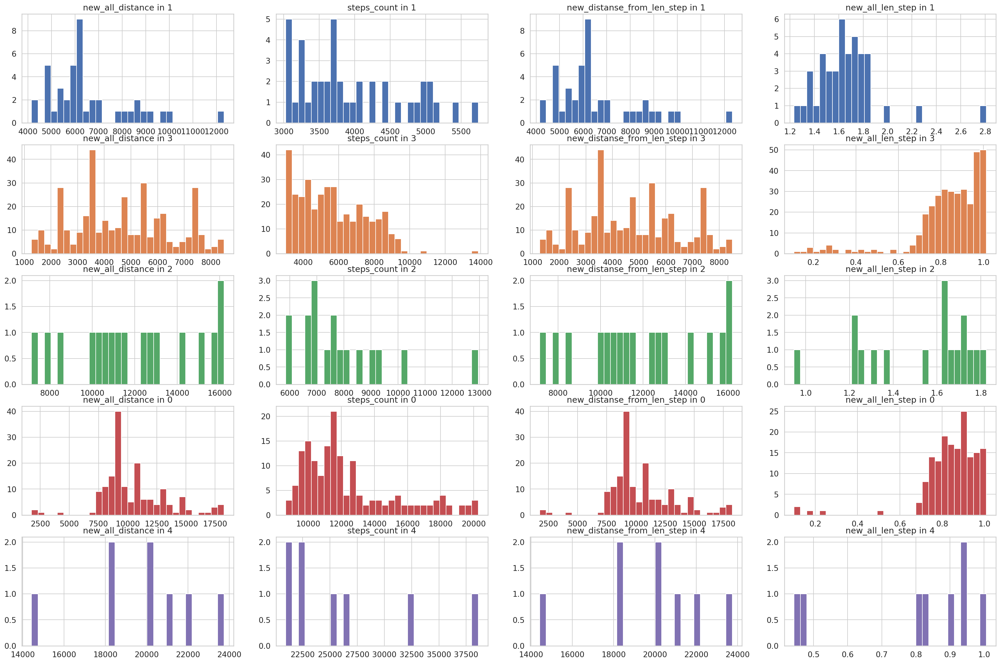

In [550]:
fig, ax = plt.subplots(len(all_cluster_label),len(list_dist_feature_all), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_dist_feature_all):
    for num_name, name in enumerate(all_cluster_label):
        data.loc[(data['no_distance_flag']==True)&(data['cluster']== name)][feature].\
        hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ str(name))

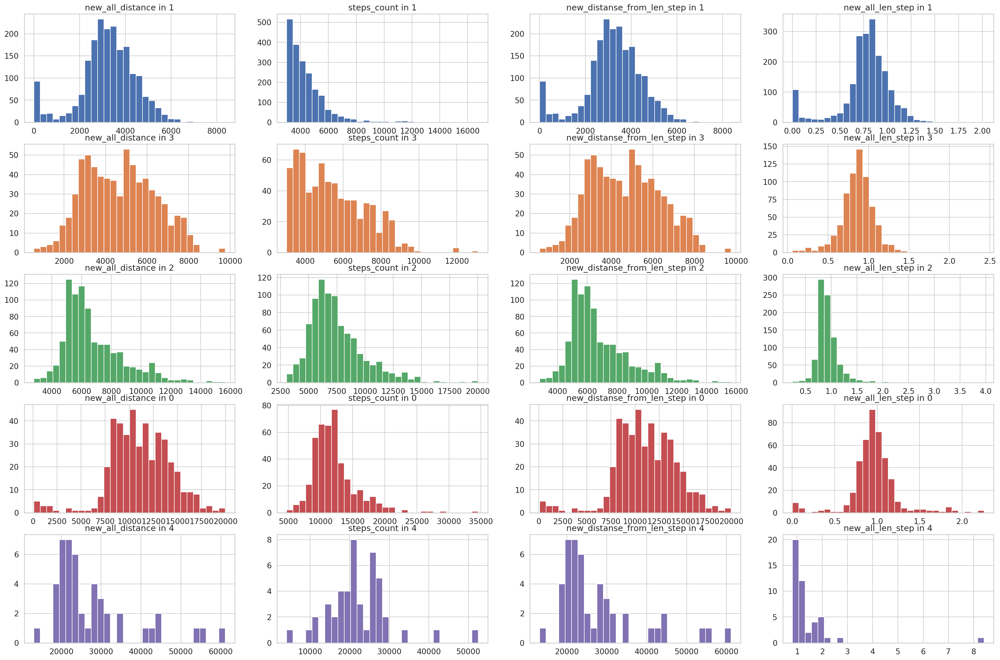

In [551]:
fig, ax = plt.subplots(len(all_cluster_label),len(list_dist_feature_all), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_dist_feature_all):
    for num_name, name in enumerate(all_cluster_label):
        data.loc[(data['no_distance_flag']==False)&(data['cluster']== name)][feature].\
        hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ str(name))

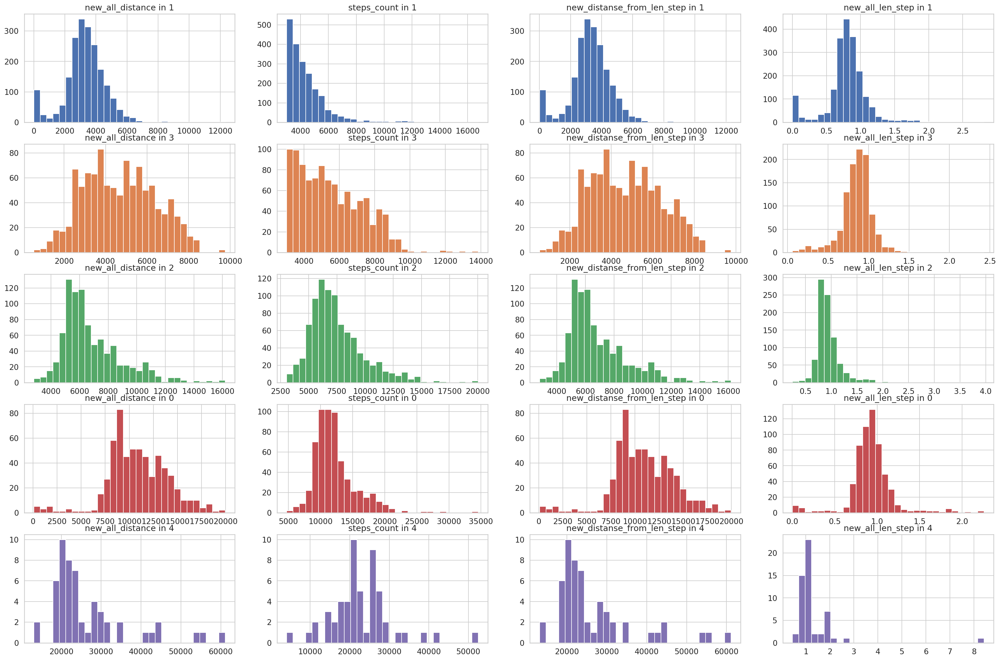

In [552]:
fig, ax = plt.subplots(len(all_cluster_label),len(list_dist_feature_all), figsize = (30,20))
sns.set_context("notebook", font_scale=1.2)

for num_feature, feature in enumerate(list_dist_feature_all):
    for num_name, name in enumerate(all_cluster_label):
        data.loc[(True)&(data['cluster']== name)][feature].\
        hist(color=all_cluster_palette[num_name], bins=30, ax=ax[num_name, num_feature])
        ax[num_name, num_feature].set_title(feature + ' in '+ str(name))

(0, 20000)

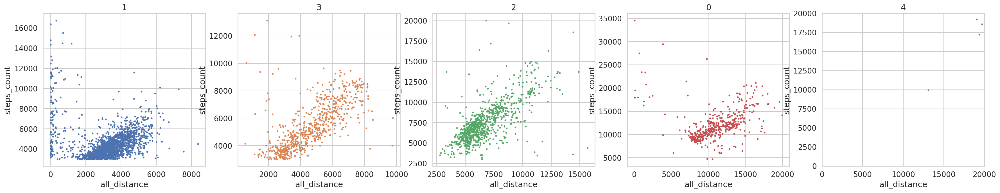

In [555]:
plt.rcParams["figure.figsize"]=(30, 5)
for num_name, name in enumerate(all_cluster_label):
    plt.subplot(1, 5, num_name+1)
    plt.scatter(data[data['cluster'] == name]['distance'],\
                data[data['cluster'] == name]['steps_count'],\
                s = 4, color =all_cluster_palette[num_name])
    plt.title(name)
    plt.xlabel('all_distance')
    plt.ylabel('steps_count')
plt.xlim([0,20000])
plt.ylim([0,20000])

(0, 10)

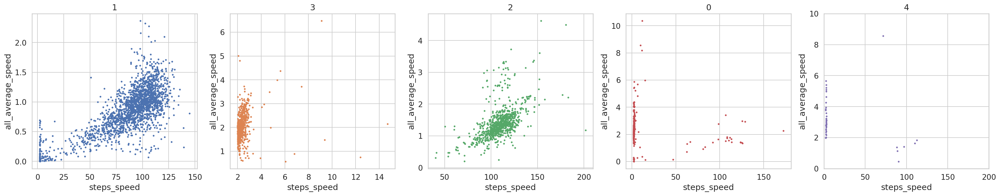

In [556]:
plt.rcParams["figure.figsize"]=(30, 5)
for num_name, name in enumerate(all_cluster_label):
    plt.subplot(1, 5, num_name+1)
    plt.scatter(data[data['cluster'] == name]['steps_speed'],\
                data[data['cluster'] == name]['average_speed'],\
                s = 4, color =all_cluster_palette[num_name])
    plt.title(name)
    plt.xlabel('steps_speed')
    plt.ylabel('all_average_speed')
plt.xlim([0,200])
plt.ylim([0,10])

In [565]:
# Описание workout_duration

claster_name=  1 len_claster=  1873 mean_workout_duration=  3632.5632674853177 mean_steps_speed=  93.13928990923648
claster_name=  3 len_claster=  3 mean_workout_duration=  1721.6666666666667 mean_steps_speed=  2.7763333333333335
claster_name=  2 len_claster=  887 mean_workout_duration=  5027.841036076663 mean_steps_speed=  109.04647012401372
claster_name=  0 len_claster=  23 mean_workout_duration=  10460.91304347826 mean_steps_speed=  108.30826086956519
claster_name=  4 len_claster=  7 mean_workout_duration=  12404.0 mean_steps_speed=  94.08842857142858


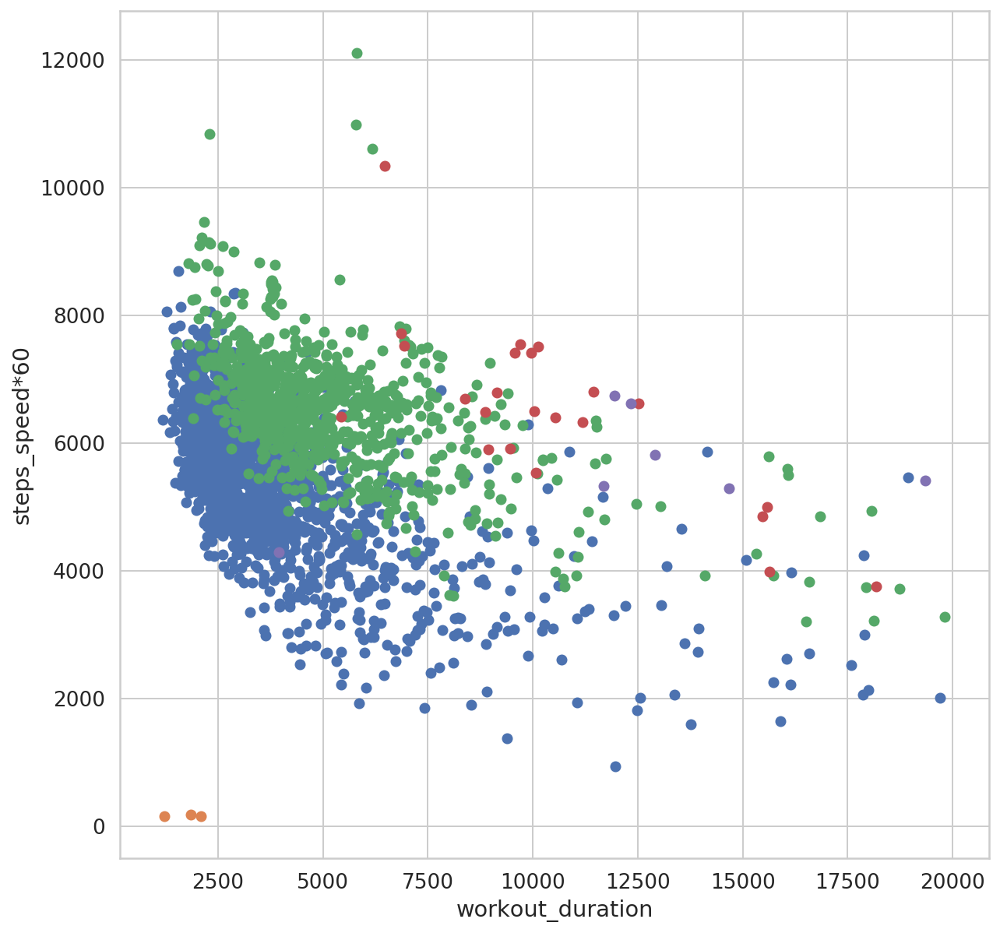

In [574]:
plt.rcParams["figure.figsize"]=(10, 10)

for num_name, name in enumerate(all_cluster_label):
    
    len_claster = len(data.loc[(~data['workout_duration'].isin([np.nan]))&\
                         (data['cluster']== name)&\
                         (data['workout_duration']< 20000)])
    mean_workout_duration = data.loc[(~data['workout_duration'].isin([np.nan]))&\
                           (data['cluster']== name)&\
                           (data['workout_duration']< 20000)]['workout_duration'].mean()
    mean_steps_speed = data.loc[(~data['workout_duration'].isin([np.nan]))&\
                           (data['cluster']== name)&\
                           (data['workout_duration']< 20000)]['steps_speed'].mean()
    
    print('claster_name= ', name, \
          'len_claster= ', len_claster,\
          'mean_workout_duration= ', mean_workout_duration,\
          'mean_steps_speed= ', mean_steps_speed)
    
    
    plt.scatter(data.loc[(~data['workout_duration'].isin([np.nan]))&\
                         (data['cluster']== name)&\
                         (data['workout_duration']< 20000)]['workout_duration'],
                data.loc[(~data['workout_duration'].isin([np.nan]))&\
                         (data['cluster']== name)&\
                         (data['workout_duration']< 20000)]['steps_speed']*60 ,
               color = all_cluster_palette[num_name])
    plt.xlabel('workout_duration')
    plt.ylabel('steps_speed*60')

claster_name=  1 len_claster=  1873 mean_workout_duration=  3632.5632674853177 mean_distance=  3521.446504132308
claster_name=  3 len_claster=  3 mean_workout_duration=  1721.6666666666667 mean_distance=  2536.476666666667
claster_name=  2 len_claster=  883 mean_workout_duration=  5020.559455266138 mean_distance=  6787.32941091165
claster_name=  0 len_claster=  14 mean_workout_duration=  10270.857142857143 mean_distance=  13105.673785714289
claster_name=  4 len_claster=  0 mean_workout_duration=  nan mean_distance=  nan


Text(0, 0.5, 'new_all_distance')

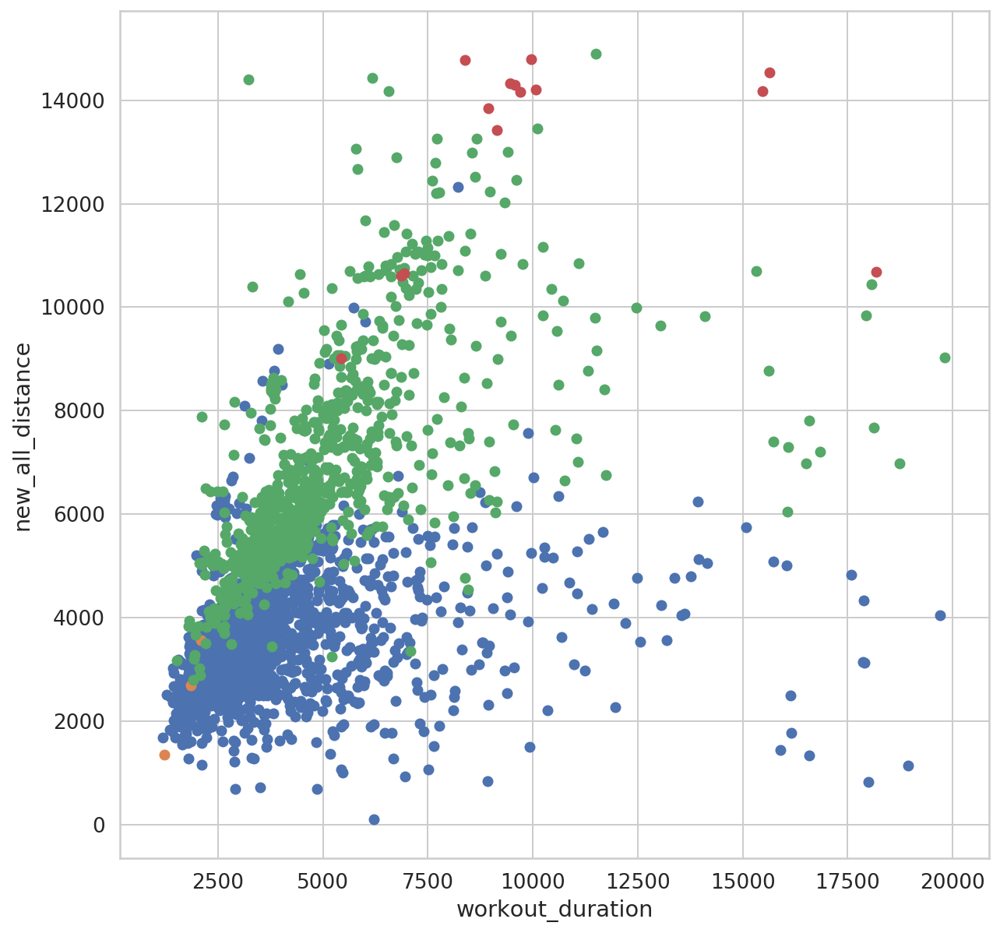

In [572]:
for num_name, name in enumerate(all_cluster_label):
    
    len_claster = len(data.loc[(~data['workout_duration'].isin([np.nan]))&\
                         (data['cluster']== name)&\
                         (data['workout_duration']< 20000)&\
                         (data['new_all_distance']< 15000)])
    mean_workout_duration = data.loc[(~data['workout_duration'].isin([np.nan]))&\
                           (data['cluster']== name)&\
                           (data['workout_duration']< 20000)&\
                         (data['new_all_distance']< 15000)]['workout_duration'].mean()
    mean_distance = data.loc[(~data['workout_duration'].isin([np.nan]))&\
                           (data['cluster']== name)&\
                           (data['workout_duration']< 20000)&\
                         (data['new_all_distance']< 15000)]['new_all_distance'].mean()
    
    print('claster_name= ', name, \
          'len_claster= ', len_claster,\
          'mean_workout_duration= ', mean_workout_duration,\
          'mean_distance= ', mean_distance)
    
    
    plt.scatter(data.loc[(~data['workout_duration'].isin([np.nan]))&\
                         (data['cluster']== name)&\
                         (data['workout_duration']< 20000)&\
                         (data['new_all_distance']< 15000)]['workout_duration'],
                data.loc[(~data['workout_duration'].isin([np.nan]))&\
                         (data['cluster']== name)&\
                         (data['workout_duration']< 20000)&\
                         (data['new_all_distance']< 15000)]['new_all_distance'] ,
               color = all_cluster_palette[num_name])
plt.xlabel('workout_duration')
plt.ylabel('new_all_distance')

Text(0, 0.5, 'time_steps*60')

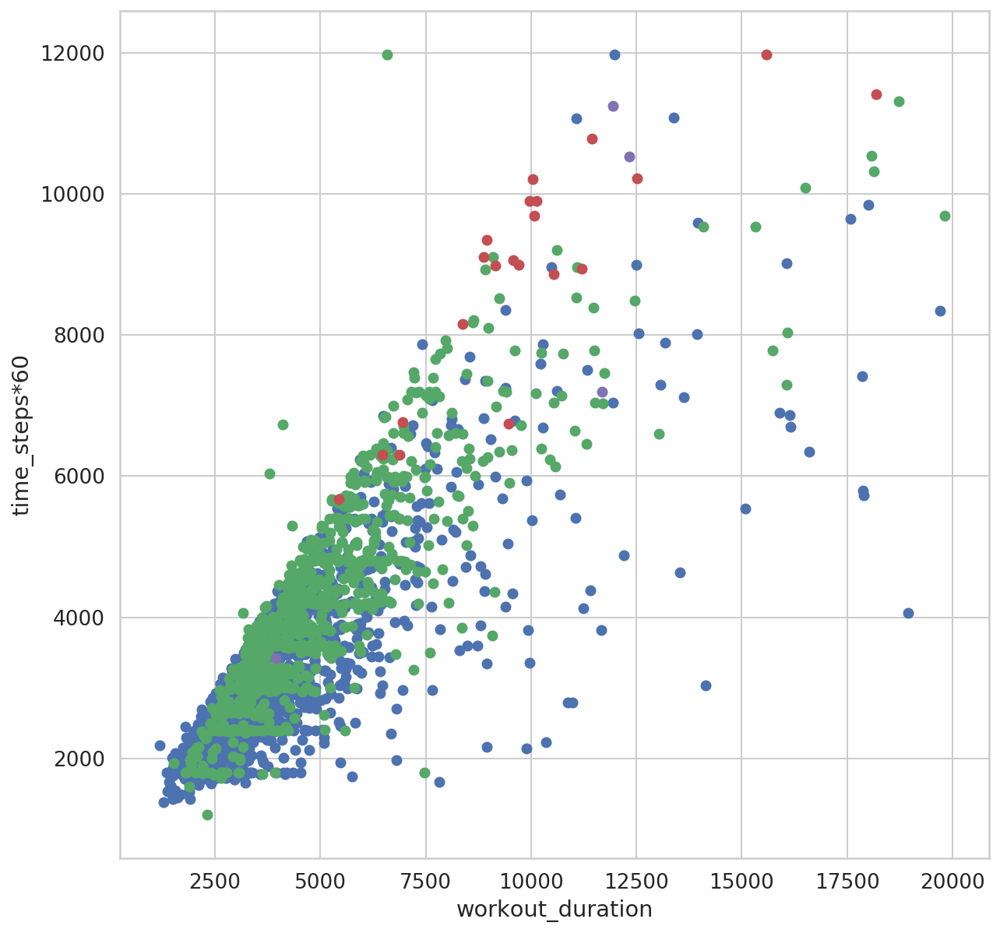

In [575]:
for num_name, name in enumerate(all_cluster_label):
    plt.scatter(data.loc[(~data['workout_duration'].isin([np.nan]))&\
                         (data['time_steps']<200)&\
                         (data['workout_duration']<20000)&\
                         (data['cluster']== name)]['workout_duration'],
                data.loc[(~data['workout_duration'].isin([np.nan]))&\
                         (data['time_steps']<200)&\
                         (data['workout_duration']<20000)&\
                         (data['cluster']== name)]['time_steps']*60,
               color = all_cluster_palette[num_name])
plt.xlabel('workout_duration')
plt.ylabel('time_steps*60')

Text(0, 0.5, 'activity_time')

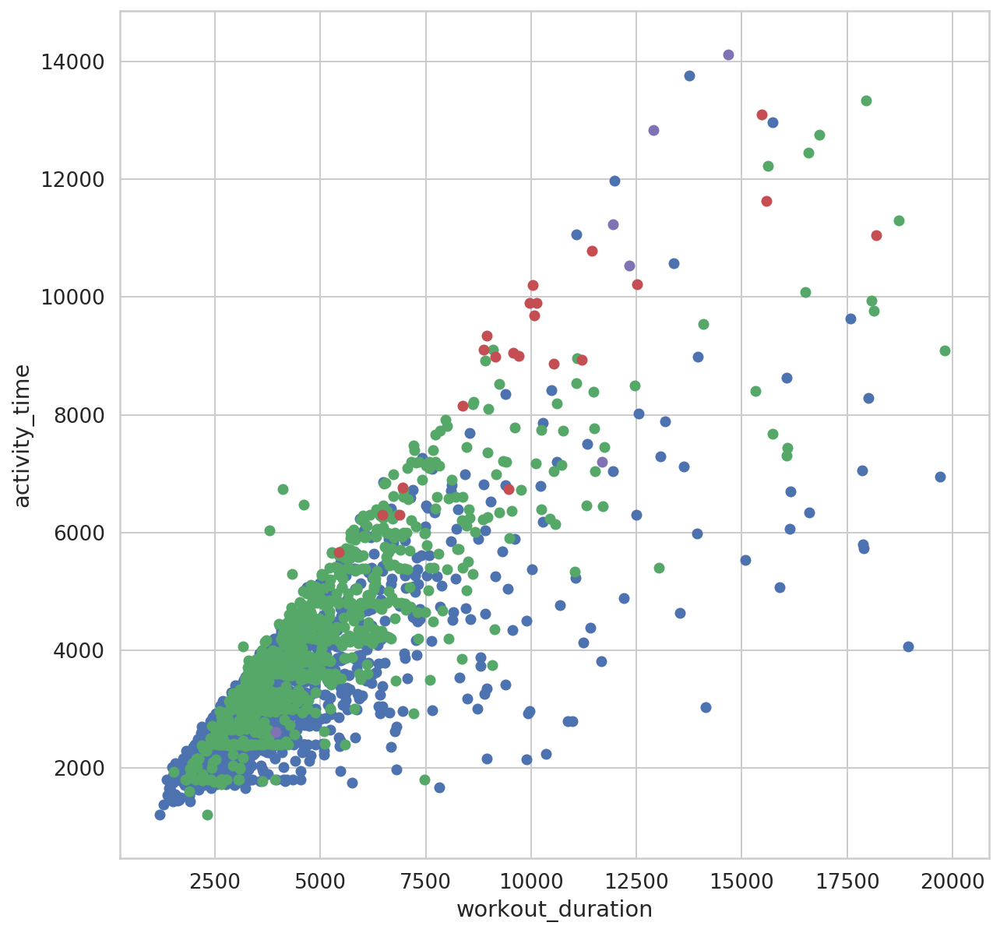

In [576]:
for num_name, name in enumerate(all_cluster_label):
    plt.scatter(data.loc[(~data['workout_duration'].isin([np.nan]))&\
                         (data['cluster']== name)&\
                         (data['workout_duration']< 20000)&\
                         (data['activity_time']< 15000)]['workout_duration'],
                data.loc[(~data['workout_duration'].isin([np.nan]))&\
                         (data['cluster']== name)&\
                         (data['workout_duration']< 20000)&\
                         (data['activity_time']< 15000)]['activity_time'] ,
               color = all_cluster_palette[num_name])
plt.xlabel('workout_duration')
plt.ylabel('activity_time')

Text(0, 0.5, 'steps_speed')

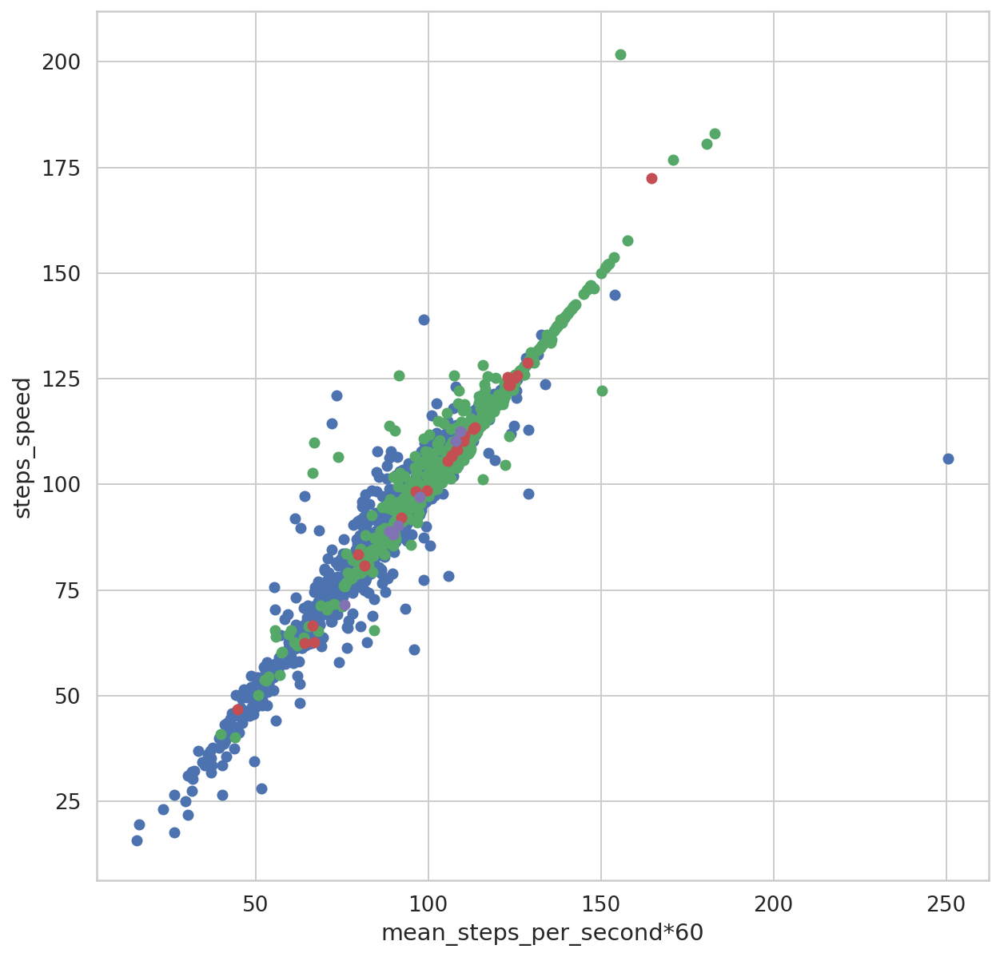

In [580]:
for num_name, name in enumerate(all_cluster_label):
    plt.scatter(data.loc[(~data['mean_steps_per_second'].isin([np.nan]))&(data['cluster']== name)]['mean_steps_per_second']*60,
                data.loc[(~data['mean_steps_per_second'].isin([np.nan]))&(data['cluster']== name)]['steps_speed'] ,
               color = all_cluster_palette[num_name])
plt.xlabel('mean_steps_per_second*60')
plt.ylabel('steps_speed')

Text(0, 0.5, 'time_steps*60')

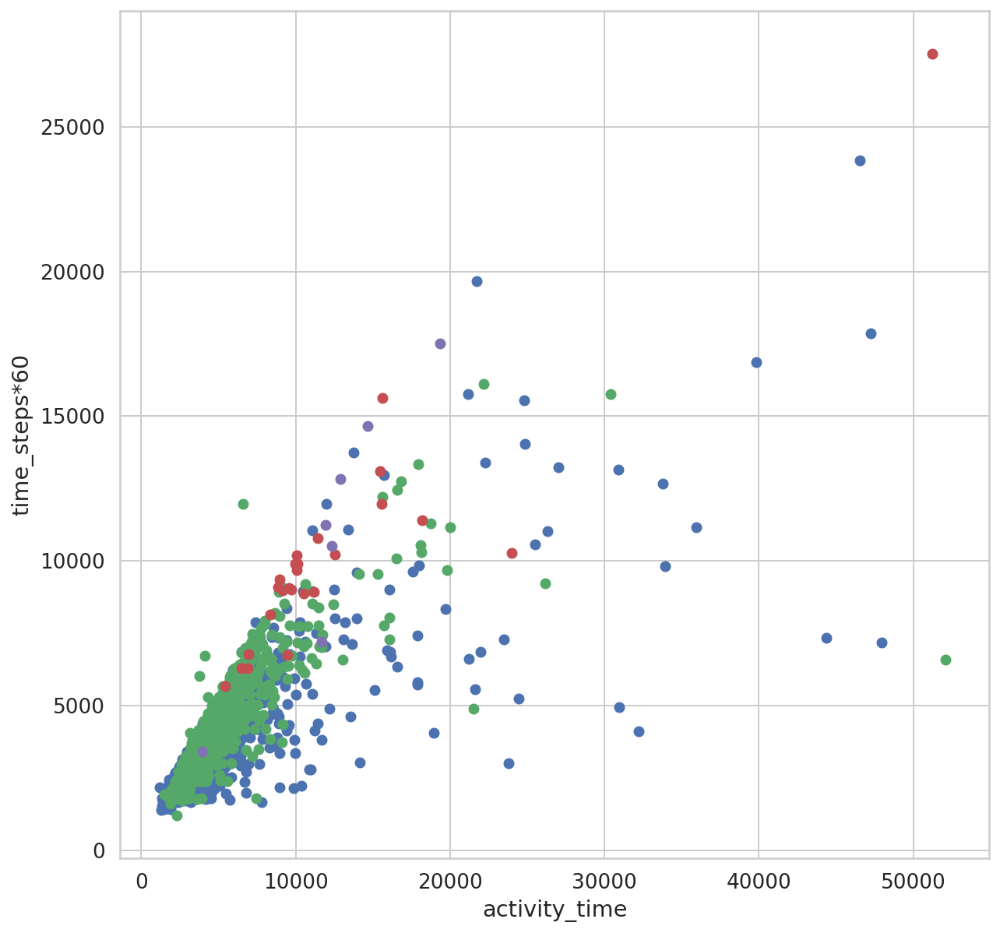

In [599]:
for num_name, name in enumerate(all_cluster_label):
    plt.scatter(data.loc[(~data['activity_time'].isin([np.nan]))&(True)&(data['cluster']== name)]['workout_duration'],
                data.loc[(~data['activity_time'].isin([np.nan]))&(True)&(data['cluster']== name)]['time_steps']*60,
               color = all_cluster_palette[num_name])
plt.xlabel('activity_time')
plt.ylabel('time_steps*60')

Text(0, 0.5, 'time_steps*60')

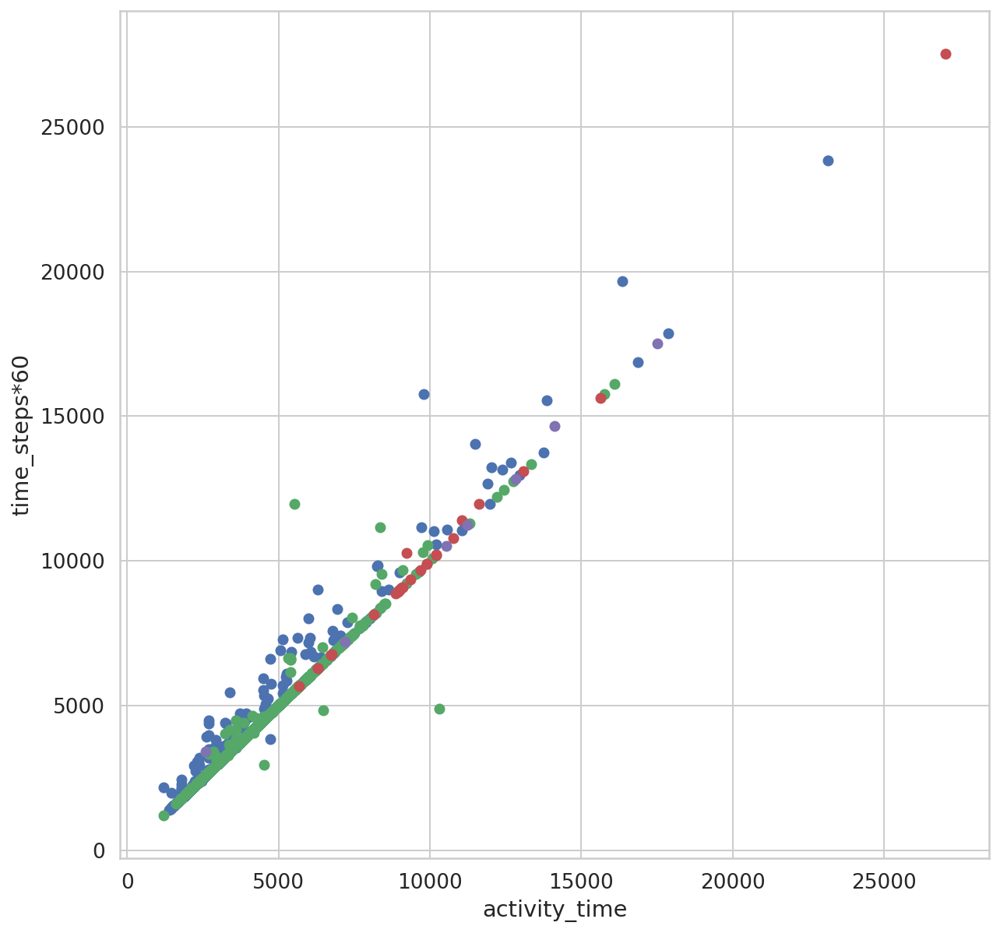

In [581]:
for num_name, name in enumerate(all_cluster_label):
    plt.scatter(data.loc[(~data['activity_time'].isin([np.nan]))&(True)&(data['cluster']== name)]['activity_time'],
                data.loc[(~data['activity_time'].isin([np.nan]))&(True)&(data['cluster']== name)]['time_steps']*60,
               color = all_cluster_palette[num_name])
plt.xlabel('activity_time')
plt.ylabel('time_steps*60')

Text(0, 0.5, 'average_speed')

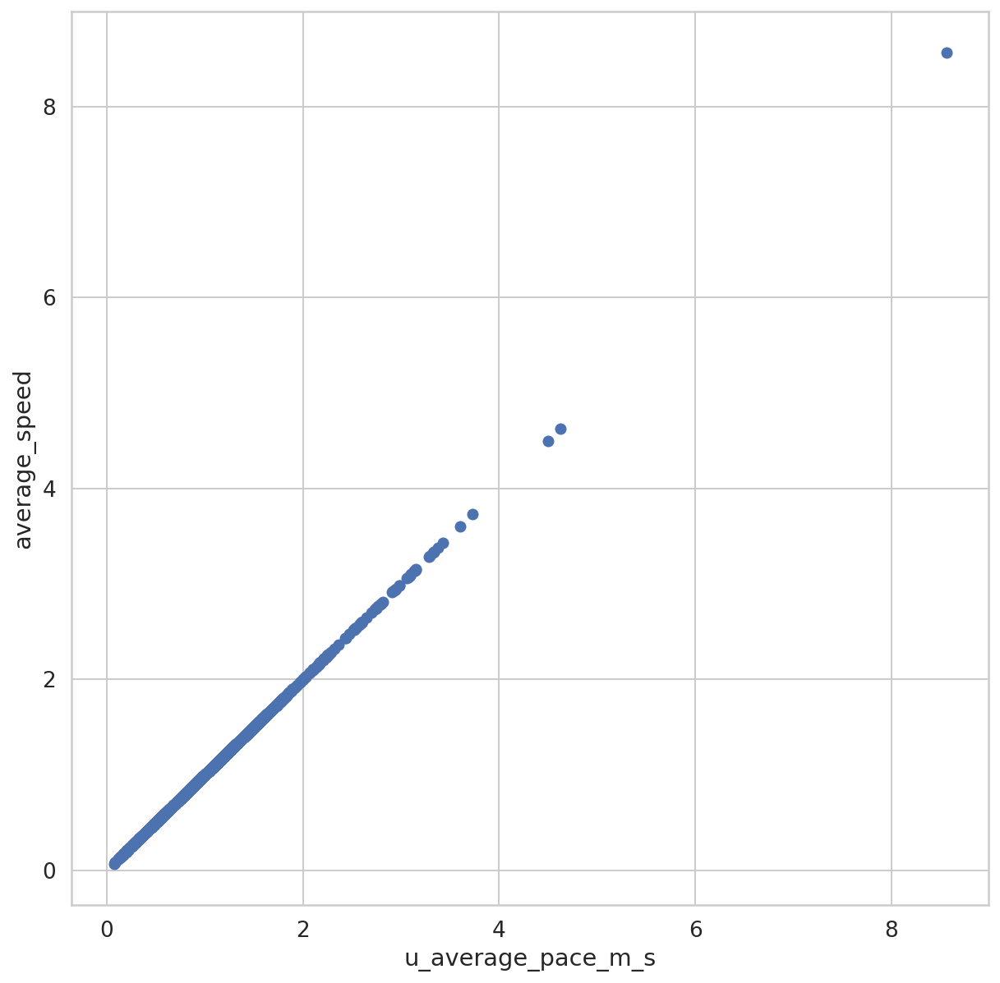

In [583]:
plt.scatter(data['u_average_pace_m_s'],\
            data['average_speed'])
plt.xlabel('u_average_pace_m_s')
plt.ylabel('average_speed')

In [600]:
# Анализируя данные, был сделан вывод, что измерения steps_speed в шагах в секунду, 
# а значит, значения выше 3 шагов в секунду - неадекватные показания приборов
# Исходя из этого вывода, описание данных выглядит следующим образом:
#
# Ошибочные метки предыдущего дата-аналитика
# (никакой смысловой нагрузки не несут):
# base_types_of_workout
# categories_of_workout
# mobility_type_of_workout
# workout_type
# workout_type_source
# k
#
# ----------------------------------------
#
# МРТ
# activity_time = hf_time + lf_time + mf_time + run_time
# все членны суммы описывают частотные харрактеристики сердечного ритма
# еще почему-то activity_time = steps_cout/steps_speed*60
#
# ---------------------------------------- 
#
# Калории
# basal_calories_burned
# active_calories_burned
#
#---------------------------------------- 
#
# Кардиозоны
# aerobic_cardio_zone
# anaerobic_cardio_zone
# red_line_cardio_zone
# therapeutic_cardio_zone
# under_therapeutic_cardio_zone
# low_cardio_zone
#
#---------------------------------------- 
#
# Пульс
# pulse_average
# pulse_max
# pulse_min
# pulse_mediana
# pulse_on_begin
# pulse_on_end
# 
#---------------------------------------- 
#
# Шаги (вычеслины ошибочно, исходя из того, что steps_speed принимался в шагах в мин)
# max_steps_per_minute
# max_steps_per_second
# min_steps_per_second
# mean_steps_per_second
# steps_speed_d
# steps_speed_n
# ------------- 
# steps_count
# steps_speed
#
#---------------------------------------- 
#
# Высоты
# total_elevation_gain
# total_elevation_loss
#
#---------------------------------------- 
#
# Скорость в метрах в секунду
#
#---------------------------------------- 
#
# average_speed
# max_speed
#
#---------------------------------------- 
#
# Ритм
# average_pace (в мин/км) - выведен из average_speed
# max_pace
#
#---------------------------------------- 
#
# Расстояние
#
# distance (метры)
#
#---------------------------------------- 
#
# Не разобрался
#
# workout_duration близко к activity_time, а значит и к steps_cout/steps_speed*60
# uniformity
# exercis_time
# distance_wheelchair

In [603]:
# Выводы по кластерам:
# В предоставленных данных прогулак не обнаружено
# Кластеры 1 и 2 с большим количеством шагов в секунду вероятнне всего - прогулки на электросамокате
# или чем-то похожим при средней скорости 4.32 км/ч. Предполагаю, что количество шагов при езде по асфальту
# (или другой случай наличия высокочастотной тряски)соизмеримо со скоростью и может быть равно 100 шагов в секунду
# 
#
# Кластеры 3,0,4 - больше похожи на физические нагрузки по аэробным, анаэробным зонам, калориям и самое
# главное - пульсу. Но средняя скорость в 9 км/ч говорит от том, что это скорее бег. Длина среднего шага 
# подтверждает эту догадку
#
# Возможно, что step_speed в шагах в минуту, тогда мы имеем человека, кторый на скорости в 9 км/ч почти не шагая
# как-то перемещается и при этом у него повышенный пульс. По анологии с предыдущим примером, он ездит на самокате
# и очень боится, поэтому повышен пульс. Маловероятно. Но в этом случае, да, можгно идентифицировать кластеры
# 1 и 2 как пешие прогулки.
#
# Возможно step_speed кусочно-неадекватен и одна его часть измеряется в шагах в секунду, 
# а другая - в шагах в минуту. Тогда step_speed тоже детище предыдущего аналитика.
# Но это одни из немногих непрерывных данных, поэтому я откинул эту идею, а точнее, на полноценную проверку 
# ее как и на статистические выводы времени не хватило.
